# Part A: CVAE Improvements and Experiments

Previously, we trained a baseline CVAE with limited class fidelity. In this notebook, we evaluate targeted architecture and training changes to identify a stronger final model.


## 1. Imports and Setup


In [1]:
import os
from pathlib import Path
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import pandas as pd
import json
import seaborn as sns
from torch.utils.data import TensorDataset, DataLoader
from datasets import Dataset, load_dataset
from sklearn.metrics import normalized_mutual_info_score
from torchmetrics.image.fid import FrechetInceptionDistance

def save_state_dict_pt(model, path):
    """Save a native PyTorch state dictionary."""
    torch.save(model.state_dict(), Path(path))


def load_state_dict_pt(model, path, strict=True):
    """Load a native PyTorch state dictionary into an existing model."""
    state_dict = torch.load(Path(path), map_location="cpu", weights_only=True)
    return model.load_state_dict(state_dict, strict=strict)

# Set random seed for reproducibility.
torch.manual_seed(42)
np.random.seed(42)

In [2]:
# Shared design system for the Part A notebooks: one categorical color per CIFAR-10 class.
PALETTE = [
    "#A1533F",  # 0 airplane   - terracotta
    "#C08A3E",  # 1 automobile - ochre
    "#3D8049",  # 2 bird       - sage
    "#24558F",  # 3 cat        - slate blue
    "#8A3466",  # 4 deer       - plum
    "#4552A8",  # 5 dog        - indigo
    "#8C3F32",  # 6 frog       - brick red
    "#B79A2E",  # 7 horse      - mustard
    "#B5615B",  # 8 ship       - rose
    "#6B7A1A",  # 9 truck      - olive
]
sns.set_theme(style="whitegrid", palette=PALETTE)
plt.rcParams["figure.facecolor"] = "#fcfcfb"
plt.rcParams["axes.facecolor"] = "#fcfcfb"

In [3]:
# Re-define the baseline's Sampling/Encoder/Decoder/CVAE/Classifier builders here (self-contained, no shared .py) so each experiment can vary one of them.
class Sampling(nn.Module):
    """Reparameterization trick: z = z_mean + std * epsilon, epsilon ~ N(0, 1)."""

    def forward(self, z_mean, z_log_var):
        std = torch.exp(0.5 * z_log_var)
        epsilon = torch.randn_like(std)
        return z_mean + std * epsilon


class Encoder(nn.Module):
    def __init__(self, num_classes, latent_dim):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(3 + num_classes, 32, kernel_size=3, stride=2, padding=1),  # 32x32 -> 16x16
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),  # 16x16 -> 8x8
            nn.ReLU(),
        )
        self.fc_mean = nn.Linear(64 * 8 * 8, latent_dim)
        self.fc_log_var = nn.Linear(64 * 8 * 8, latent_dim)
        self.sampling = Sampling()

    def forward(self, x, y):
        # Broadcast the one-hot label into a spatial map so it can be concatenated as extra input channels.
        y_map = y.view(y.size(0), -1, 1, 1).expand(-1, -1, x.size(2), x.size(3))
        x = torch.cat([x, y_map], dim=1)

        features = self.conv(x).flatten(start_dim=1)
        z_mean = self.fc_mean(features)
        z_log_var = self.fc_log_var(features)
        z = self.sampling(z_mean, z_log_var)
        return z_mean, z_log_var, z


class Decoder(nn.Module):
    def __init__(self, num_classes, latent_dim):
        super().__init__()
        self.fc = nn.Linear(latent_dim + num_classes, 64 * 8 * 8)
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),  # 8x8 -> 16x16
            nn.ReLU(),
            nn.ConvTranspose2d(32, 3, kernel_size=3, stride=2, padding=1, output_padding=1),  # 16x16 -> 32x32
            nn.Sigmoid(),
        )

    def forward(self, z, y):
        # No spatial grid to broadcast into yet, so the label is concatenated directly onto z instead.
        x = torch.cat([z, y], dim=1)
        x = self.fc(x).view(-1, 64, 8, 8)
        return self.deconv(x)


class CVAE(nn.Module):
    def __init__(self, encoder, decoder, kl_weight=1.0):
        super().__init__()
        self.encoder = encoder
        self.decoder = decoder
        self.kl_weight = kl_weight

    def forward(self, x, y):
        z_mean, z_log_var, z = self.encoder(x, y)
        reconstruction = self.decoder(z, y)
        return reconstruction, z_mean, z_log_var

    def loss(self, x, y):
        reconstruction, z_mean, z_log_var = self(x, y)

        # Summed BCE + closed-form Gaussian KL, matching the baseline's loss formulation exactly so losses stay comparable.
        reconstruction_loss = F.binary_cross_entropy(reconstruction, x, reduction="sum") / x.size(0)
        kl_loss = -0.5 * torch.sum(1 + z_log_var - z_mean.pow(2) - z_log_var.exp(), dim=1).mean()
        total_loss = reconstruction_loss + self.kl_weight * kl_loss

        return total_loss, reconstruction_loss, kl_loss


# GPU if available, since every experiment retrains a full CVAE from scratch.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)

class Classifier(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1), nn.ReLU(), nn.MaxPool2d(2),  # 32x32 -> 16x16
            nn.Conv2d(32, 64, kernel_size=3, padding=1), nn.ReLU(), nn.MaxPool2d(2),  # 16x16 -> 8x8
            nn.Conv2d(64, 128, kernel_size=3, padding=1), nn.ReLU(), nn.MaxPool2d(2),  # 8x8 -> 4x4
        )
        self.fc = nn.Linear(128 * 4 * 4, num_classes)

    def forward(self, x):
        return self.fc(self.conv(x).flatten(start_dim=1))


device: cuda


In [4]:
# train_cvae(): same training loop as the baseline, reused by every experiment below instead of rewriting it each time.
# Experiments don't save checkpoints to disk (only the baseline and final model do), so this just returns the trained model + history.
# x/y_train_data, x/y_val_data default to the global color/one-hot tensors; Experiments 4 and 5 pass overrides (grayscale images, augmented conditioning).
def train_cvae(cvae, num_epochs=30, batch_size=128, lr=1e-3, x_train_data=None, x_val_data=None, y_train_data=None, y_val_data=None):
    if x_train_data is None:
        x_train_data = x_train
    if x_val_data is None:
        x_val_data = x_val
    if y_train_data is None:
        y_train_data = y_train_onehot
    if y_val_data is None:
        y_val_data = y_val_onehot

    cvae = cvae.to(device)
    x_train_dev, y_train_dev = x_train_data.to(device), y_train_data.to(device)
    x_val_dev, y_val_dev = x_val_data.to(device), y_val_data.to(device)

    train_loader = DataLoader(TensorDataset(x_train_dev, y_train_dev), batch_size=batch_size, shuffle=True)
    optimizer = torch.optim.Adam(cvae.parameters(), lr=lr)
    history = {"train_loss": [], "val_loss": []}

    for epoch in range(num_epochs):
        cvae.train()
        train_loss = 0.0
        for xb, yb in train_loader:
            optimizer.zero_grad()
            loss, _, _ = cvae.loss(xb, yb)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * len(xb)
        train_loss /= len(x_train_dev)

        cvae.eval()
        with torch.no_grad():
            val_loss, _, _ = cvae.loss(x_val_dev, y_val_dev)
        val_loss = val_loss.item()

        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)

    print(f"trained {num_epochs} epochs - final train_loss: {history['train_loss'][-1]:.2f} - final val_loss: {history['val_loss'][-1]:.2f}")
    return cvae, history


# generate_class_images(): sample images_per_class fresh images per class from the prior, same recipe as the baseline's Section 10.1.
# label_vectors defaults to plain one-hot; Experiment 5 passes one-hot + per-class auxiliary features concatenated instead.
def generate_class_images(cvae, latent_dim, images_per_class=10, label_vectors=None):
    if label_vectors is None:
        label_vectors = torch.eye(num_classes, device=device)
    images, labels = [], []

    cvae.eval()
    with torch.no_grad():
        for class_idx in range(num_classes):
            z = torch.randn(images_per_class, latent_dim, device=device)
            y = label_vectors[class_idx : class_idx + 1].repeat(images_per_class, 1)
            images.append(cvae.decoder(z, y))
            labels.append(torch.full((images_per_class,), class_idx))

    return torch.cat(images), torch.cat(labels)


# preview_grid(): show a small class x images grid as a visual sanity check, same layout as the baseline's Section 10.2.
# Grayscale (1-channel) images are squeezed and shown with a gray colormap instead of being permuted as RGB.
def preview_grid(images, labels, n_per_class=10, title=None):
    is_grayscale = images.size(1) == 1
    fig, axes = plt.subplots(num_classes, n_per_class, figsize=(n_per_class * 1.2, num_classes * 1.2))
    for class_idx, class_name in enumerate(class_names):
        class_images = images[labels == class_idx][:n_per_class]
        for col in range(n_per_class):
            if is_grayscale:
                axes[class_idx, col].imshow(class_images[col, 0].cpu().numpy(), cmap="gray")
            else:
                axes[class_idx, col].imshow(class_images[col].permute(1, 2, 0).cpu().numpy())
            axes[class_idx, col].set_xticks([])
            axes[class_idx, col].set_yticks([])
            if col == 0:
                axes[class_idx, col].set_ylabel(class_name, fontsize=9)
    if title:
        fig.suptitle(title)
    plt.tight_layout()
    plt.show()

# compute_nmi(): generate a class-conditioned sample from a trained CVAE, classify it with the frozen baseline classifier,
# and score how well predictions match the true conditioning label via Normalized Mutual Information (Section 3.1).
def compute_nmi(cvae, latent_dim, label_vectors=None, images_per_class=100):
    images, true_labels = generate_class_images(cvae, latent_dim, images_per_class=images_per_class, label_vectors=label_vectors)
    classifier_input = images.repeat(1, 3, 1, 1) if images.size(1) == 1 else images
    with torch.no_grad():
        predicted_labels = classifier(classifier_input).argmax(dim=1)
    return normalized_mutual_info_score(true_labels.numpy(), predicted_labels.cpu().numpy())


## 2. Load Baseline Results

We load the previous VAE model's results (config, loss values), its trained CNN classifier, and its trained CVAE weights, all reused throughout this notebook.

In [5]:
# Load CIFAR-10 and apply the same preprocessing (normalize, one-hot, validation split) as the baseline notebook.
# Prefer an existing Hugging Face Arrow cache; otherwise download the same public dataset through `datasets`.
def load_cifar10_split(split):
    cache_root = Path.home() / ".cache" / "huggingface" / "datasets" / "uoft-cs___cifar10"
    cached_files = list(cache_root.rglob(f"cifar10-{split}.arrow")) if cache_root.exists() else []
    if cached_files:
        cache_file = max(cached_files, key=lambda path: path.stat().st_mtime)
        return Dataset.from_file(str(cache_file))
    return load_dataset("uoft-cs/cifar10", split=split)


train_set = load_cifar10_split("train")
test_set = load_cifar10_split("test")
class_names = train_set.features["label"].names
num_classes = len(class_names)

# Channel-first (N, C, H, W) layout, expected by torch's Conv2d layers.
train_values = train_set.with_format("torch")[:]
test_values = test_set.with_format("torch")[:]
x_train = train_values["img"].float() / 255
x_test = test_values["img"].float() / 255
y_train = train_values["label"].long()
y_test = test_values["label"].long()

# One-hot vectors give the encoder/decoder a fixed-length conditioning signal instead of a raw class index.
y_train_onehot = F.one_hot(y_train, num_classes=num_classes).float()
y_test_onehot = F.one_hot(y_test, num_classes=num_classes).float()

# Same fixed seed as the baseline, so the same 5000 images are held out as validation and results stay comparable.
val_size = 5000
generator = torch.Generator().manual_seed(42)
perm = torch.randperm(len(x_train), generator=generator)
val_idx, train_idx = perm[:val_size], perm[val_size:]

x_val, y_val, y_val_onehot = x_train[val_idx], y_train[val_idx], y_train_onehot[val_idx]
x_train, y_train, y_train_onehot = x_train[train_idx], y_train[train_idx], y_train_onehot[train_idx]

print("train:", x_train.shape, "val:", x_val.shape, "test:", x_test.shape)

train: torch.Size([45000, 3, 32, 32]) val: torch.Size([5000, 3, 32, 32]) test: torch.Size([10000, 3, 32, 32])


In [6]:
# Load the baseline's saved JSON (config, final losses, evaluation scores) for reference throughout this notebook.
with Path("../../results/part_a/vae_baseline_results.json").open(encoding="utf-8") as f:
    baseline_results = json.load(f)

print("baseline latent_dim:", baseline_results["latent_dim"], "kl_weight:", baseline_results["kl_weight"])
print("baseline final_val_loss:", baseline_results["final_val_loss"])

baseline latent_dim: 128 kl_weight: 1.0
baseline final_val_loss: 1820.26416015625


In [7]:
# Load the baseline's trained CNN classifier (frozen, eval mode) -- reused to score every experiment's generated images by NMI, so all NMI numbers here are judged by the exact same classifier as the baseline's own NMI score.
classifier = Classifier(num_classes).to(device)
classifier_checkpoint = Path("vae_classifier.pt")
load_state_dict_pt(classifier, classifier_checkpoint)
classifier.eval()
for p in classifier.parameters():
    p.requires_grad_(False)
print("Loaded frozen classifier from", classifier_checkpoint)


Loaded frozen classifier from vae_classifier.pt


In [8]:
# Load the baseline's trained CVAE weights -- reused later both to compute the baseline's own NMI score (below) and its FID (Section 10.3), so every "vs. baseline" comparison in this notebook uses the exact same trained model.
baseline_encoder = Encoder(num_classes, baseline_results["latent_dim"])
baseline_decoder = Decoder(num_classes, baseline_results["latent_dim"])
baseline_cvae = CVAE(baseline_encoder, baseline_decoder, kl_weight=baseline_results["kl_weight"]).to(device)
load_state_dict_pt(baseline_cvae, "vae_baseline_best.pt")
baseline_cvae.eval()
print("Loaded baseline CVAE from vae_baseline_best.pt")


Loaded baseline CVAE from vae_baseline_best.pt


## 3. Comparison Metrics

Before running any experiment, we explicitly define what we're measuring: how much "better" our model has performed, and how to quantify that improvement against the baseline and the other models.


### 3.1 NMI Score (primary metric)

We score each model by Normalized Mutual Information (NMI) between the baseline's frozen CNN classifier prediction for each generated image and its intended conditioning label. NMI is 0 when the predictions carry no information about the intended classes and 1 when they recover them perfectly. This provides a reproducible measure of class-conditioned separation.

In [9]:
# Recompute the baseline metrics so every model in this notebook uses the same generated-sample evaluator.
baseline_score_images, baseline_score_labels = generate_class_images(
    baseline_cvae, baseline_results['latent_dim'], images_per_class=100
)
with torch.no_grad():
    baseline_predicted = classifier(baseline_score_images).argmax(dim=1)
baseline_nmi_score = normalized_mutual_info_score(
    baseline_score_labels.numpy(), baseline_predicted.cpu().numpy()
)
baseline_per_class_acc = [
    (baseline_predicted[baseline_score_labels == class_idx] == class_idx).float().mean().item()
    for class_idx in range(num_classes)
]
print('baseline NMI score:', round(baseline_nmi_score, 3))


baseline NMI score: 0.107


### 3.2 Validation Loss (secondary / diagnostic metric)

The NMI score tells us whether the generated images are classified as their intended class, but not whether the model itself trained in a healthy way. So alongside it, we track each model's final validation loss (reconstruction error + KL divergence, measured on held-out images) as a cheap, automatic check. It flags problems like overfitting or posterior collapse even when the NMI score alone looks fine.

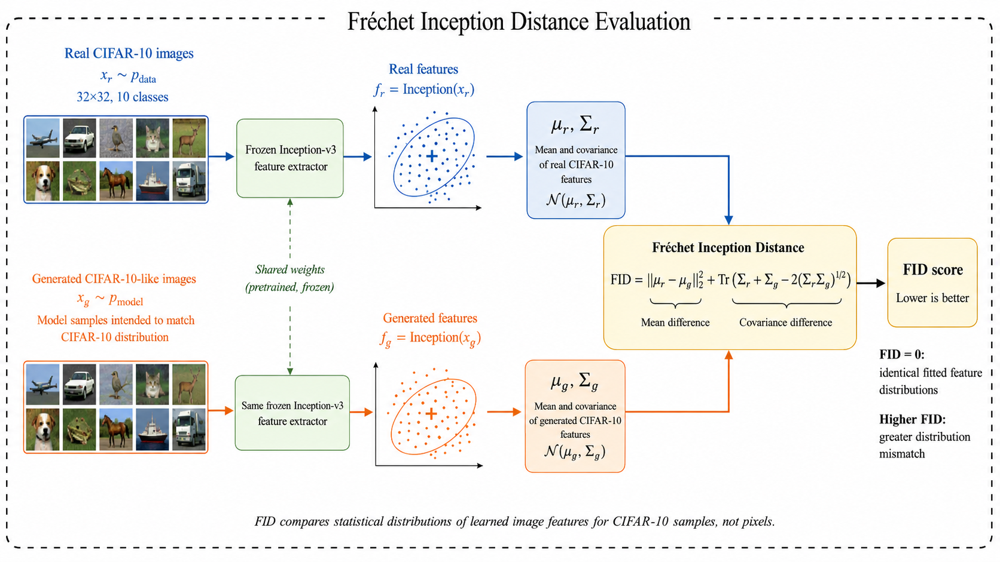

We also track FID (Fréchet Inception Distance), a standard distribution-level metric for generative image quality. FID compares the mean and covariance of learned features from real and generated images; lower values indicate closer feature distributions. Section 10 recomputes FID for both the baseline and final model with the same evaluator, so it is a quantitative final comparison rather than a ranking metric for Experiments 1–6.


### 3.3 Decision Rule

We define the selection rule upfront: NMI is the primary ranking metric because it directly measures whether generated outputs preserve the requested class information. Validation loss is used as a secondary diagnostic when NMI results are tied or when the learning curves indicate unstable training or overfitting. Loss magnitudes are compared only among configurations that use the same objective and image representation.


### 3.4 Limitations of the Measurement Protocol

Both metrics are computed from a freshly sampled set of 1,000 generated images, 100 per class, so every measurement carries sampling noise. The size of that noise can be read off this project directly instead of being estimated, because several models were measured twice under slightly different conditions.

The baseline is the clearest case. `vae_baseline.ipynb` recorded an NMI of `0.1177`. The cell in Section 3.1 above regenerates the baseline's images so that every model in this notebook is scored by one evaluator, and that recomputation returns `0.1073`. The weights and the frozen classifier are identical in both; only the sampled noise differs. The gap is `0.0104`.

That number is worth carrying through the rest of the notebook. The final model's NMI gain over the baseline is `0.0121`, so the improvement is only slightly larger than the disagreement between two measurements of one unchanged model.

FID moves further. The final CVAE scores `184.509` in Section 10.3 and `179.661` in `vae_gan_comparison.ipynb` from the same weights, a difference of `4.848`. Two things vary between those runs: the generated sample, and the real reference set, which this notebook takes as the first 1,000 validation images while the comparison notebook draws its own seeded sample. The final GAN shows the same pattern on a smaller scale, `121.460` against `122.694`.

Two structural limits sit behind these figures. FID is computed from 1,000 images, far below the 10,000 to 50,000 normally used, and the estimator is biased upward and unstable at that size. The experiments also run in sequence from the single seed set in Section 1, so each begins from a different initialisation and sees a different data order, and no experiment is repeated.

Differences of a few thousandths of NMI between experiments should therefore not be read as a ranking. Sections 4 to 9 are treated as indications rather than measurements, and Section 10 interprets the final model on that basis.

In [10]:
# Initialize a shared results dict (starting with the baseline's numbers) that every experiment appends its NMI score and val loss to.
# Note: experiments 1-6 log metrics only and do NOT save weights -- only the baseline and the Section 10 final model get saved weights.
results = {
    "baseline": {
        "nmi_score": baseline_nmi_score,
        "val_loss": baseline_results["final_val_loss"],
        "fid": baseline_results.get("fid"),
    }
}
results

{'baseline': {'nmi_score': 0.10726799192039868,
  'val_loss': 1820.26416015625,
  'fid': None}}

## 4. Experiment 1: Latent Dimension

![Latent dimension experiment](../../images/experiment-1-latent-dimension.png)

Latent capacity can affect both representation quality and regularization. This experiment compares latent dimensions 64, 256, and 512 with the baseline value of 128 to test whether a smaller or larger space improves class-conditioned separation.


In [11]:
# Build and train a CVAE identical to baseline except for latent_dim, for each candidate value.
latent_dim_variants = [64, 256, 512]
exp1_cvaes = {}
exp1_histories = {}

for ld in latent_dim_variants:
    encoder = Encoder(num_classes, ld)
    decoder = Decoder(num_classes, ld)
    cvae = CVAE(encoder, decoder, kl_weight=baseline_results["kl_weight"])
    exp1_cvaes[ld], exp1_histories[ld] = train_cvae(cvae)

trained 30 epochs - final train_loss: 1817.40 - final val_loss: 1818.49


trained 30 epochs - final train_loss: 1818.29 - final val_loss: 1818.72


trained 30 epochs - final train_loss: 1819.89 - final val_loss: 1819.92


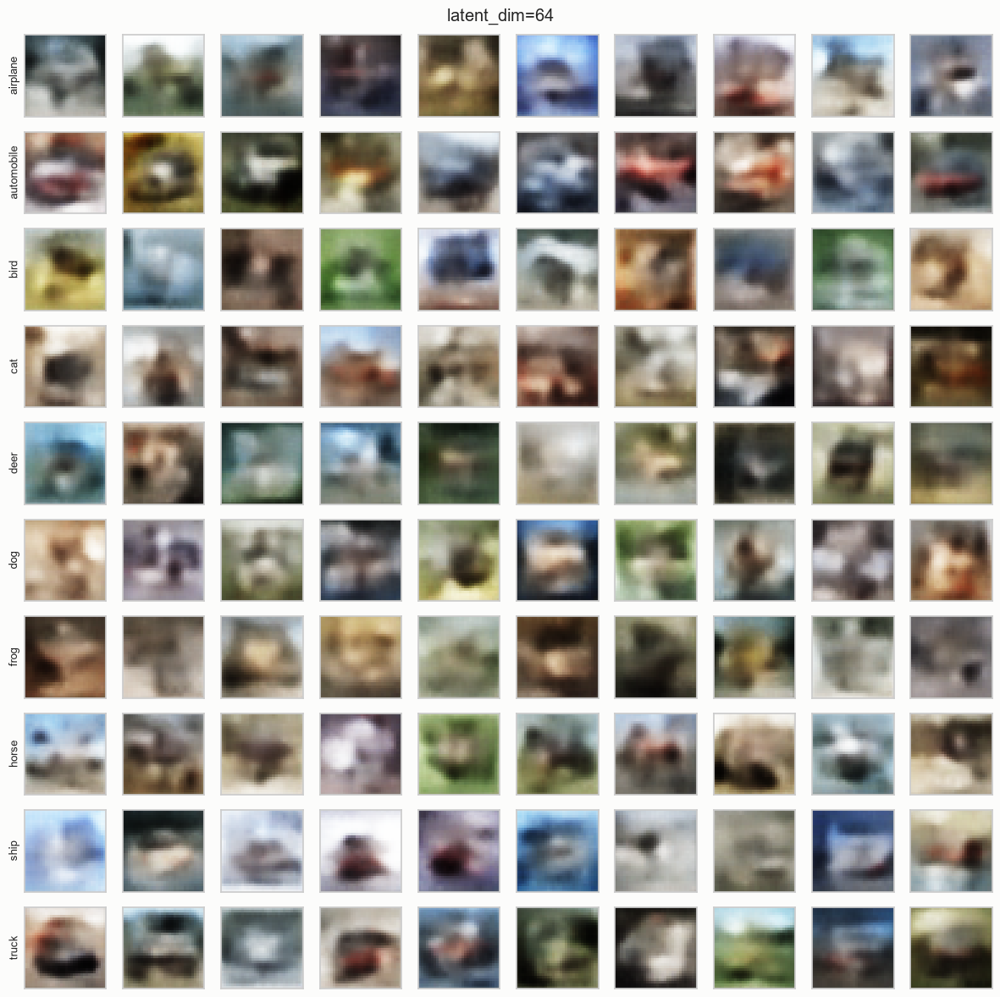

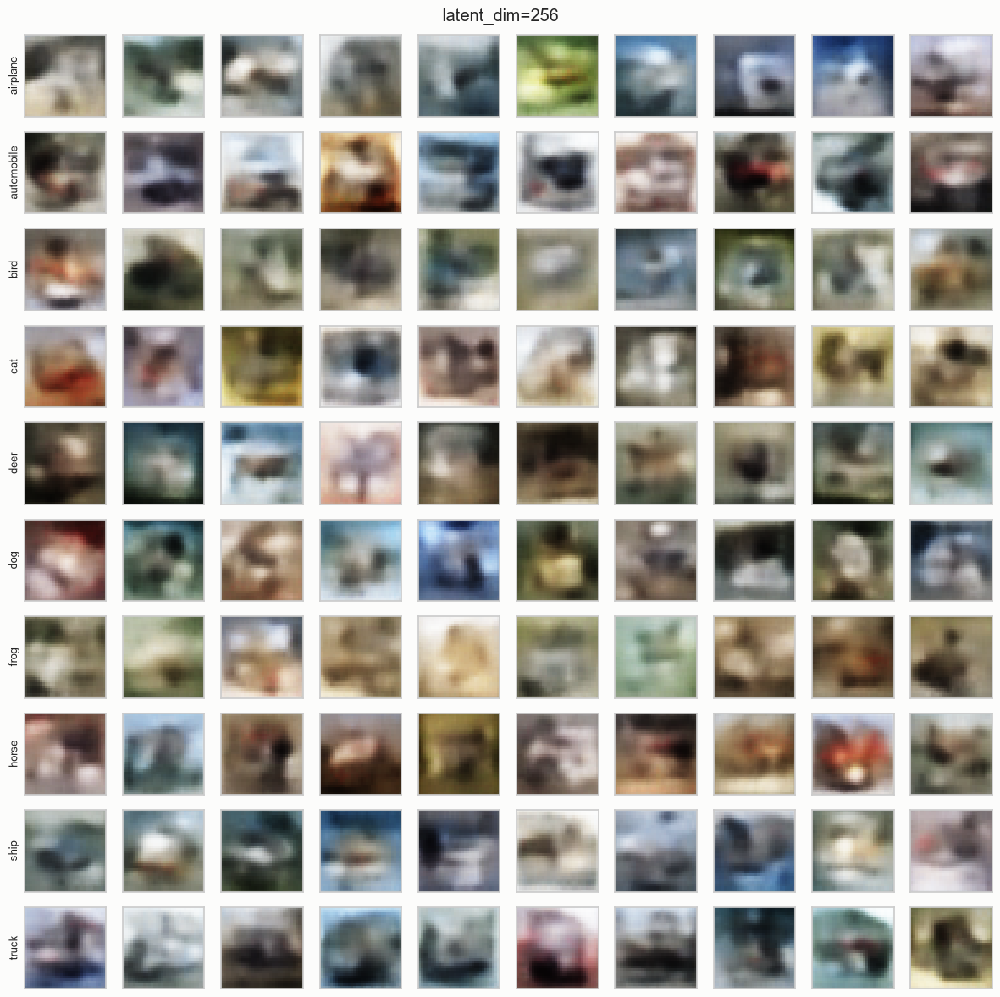

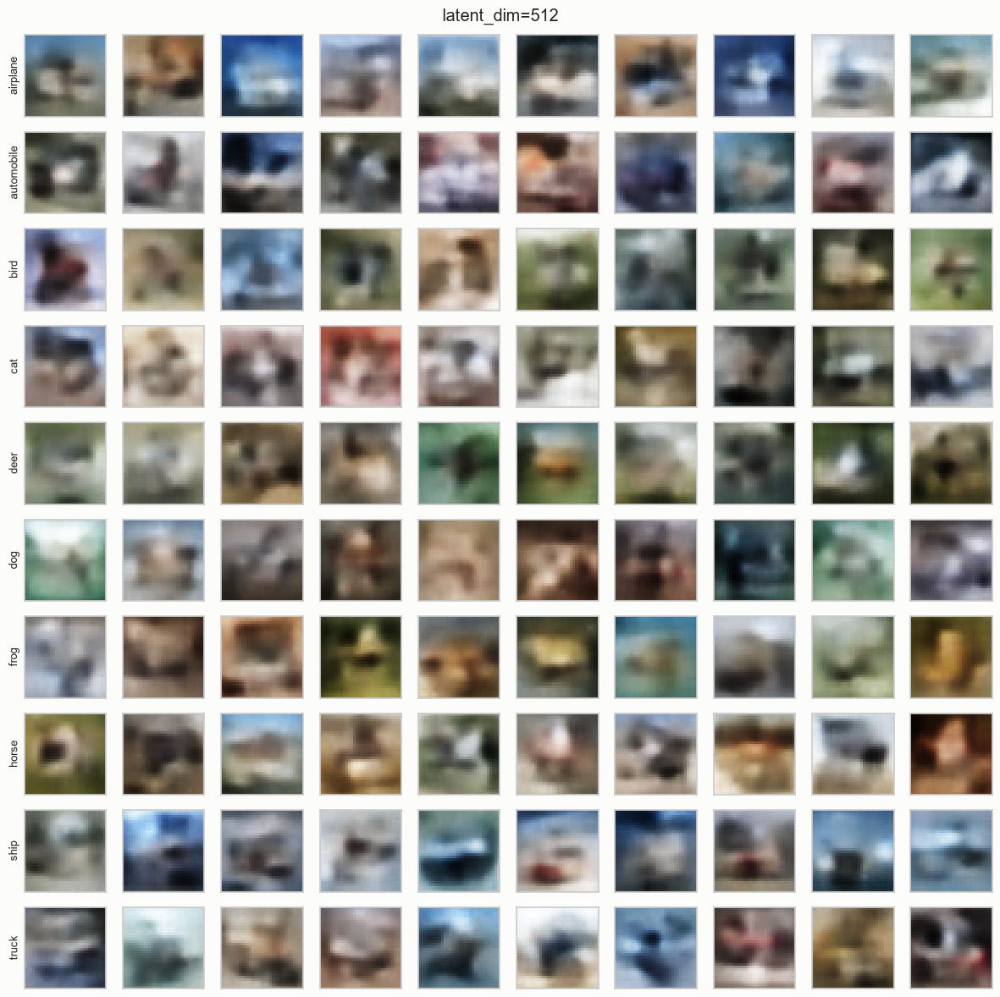

In [12]:
# Generate a sample of images per variant and preview them (visual sanity check before NMI scoring below).
exp1_images, exp1_labels = {}, {}

for ld in latent_dim_variants:
    exp1_images[ld], exp1_labels[ld] = generate_class_images(exp1_cvaes[ld], ld)
    preview_grid(exp1_images[ld], exp1_labels[ld], title=f"latent_dim={ld}")

In [13]:
# Score each variant by NMI (Section 3.1) and log nmi_score + val loss into the shared results dict.
for key in [k for k in results if k.startswith("exp1_latent_dim_")]:
    del results[key]

for ld in latent_dim_variants:
    results[f"exp1_latent_dim_{ld}"] = {
        "nmi_score": compute_nmi(exp1_cvaes[ld], ld),
        "val_loss": exp1_histories[ld]["val_loss"][-1],
        "fid": None,  # FID is only tracked for baseline and final model
    }

pd.DataFrame(results).T


,nmi_score,val_loss,fid
baseline,0.107268,1820.264160,NaN
exp1_latent_dim_64,0.137352,1818.485107,NaN
exp1_latent_dim_256,0.108499,1818.719482,NaN
exp1_latent_dim_512,0.087113,1819.919312,NaN


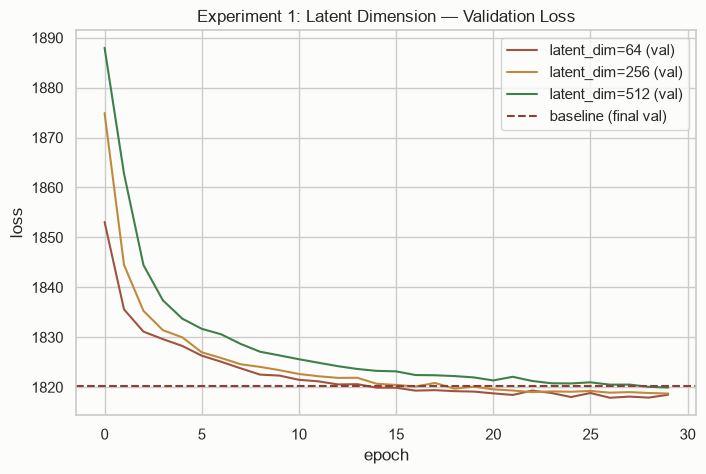

In [14]:
# Plot each variant's validation loss curve against the baseline's, on the same axes.
fig, ax = plt.subplots(figsize=(8, 5))
for i, ld in enumerate(latent_dim_variants):
    ax.plot(exp1_histories[ld]["val_loss"], label=f"latent_dim={ld} (val)", color=PALETTE[i])
ax.axhline(baseline_results["final_val_loss"], color=PALETTE[6], linestyle="--", label="baseline (final val)")
ax.set_xlabel("epoch")
ax.set_ylabel("loss")
ax.set_title("Experiment 1: Latent Dimension — Validation Loss")
ax.legend()
plt.show()

### Conclusion

Reducing the latent dimension to 64 raised NMI from the baseline's `0.1073` to `0.1374` (`+28.0%`), while 256 produced only a marginal increase to `0.1085` and 512 reduced NMI to `0.0871`. All three variants ended with slightly lower validation loss than the baseline (`1,818.49`, `1,818.72`, and `1,819.92` versus `1,820.26`), but the 512-dimensional result shows that the small loss differences did not consistently track class separation. Latent dimension 64 therefore remained a candidate for final selection.

## 5. Experiment 2: KL Weight (Beta-VAE)

![KL weight experiment](../../images/experiment-2-kl-weight.png)

We hypothesize that the baseline's kl_weight may be over-regularizing the latent space, forcing every image's encoding toward the same generic shape instead of leaving room for image-specific detail, which shows up as blurry reconstructions. So we try lower kl_weights, which we think would raise the NMI score by letting the decoder produce sharper, more detailed images at the cost of a less structured latent space (less reliable smooth interpolation and random sampling), if pushed too low.


In [15]:
# Build and train a CVAE identical to baseline (same latent_dim) except for kl_weight, for each candidate value.
kl_weight_variants = [0.1, 0.3, 0.5]
exp2_cvaes = {}
exp2_histories = {}

for kw in kl_weight_variants:
    encoder = Encoder(num_classes, baseline_results["latent_dim"])
    decoder = Decoder(num_classes, baseline_results["latent_dim"])
    cvae = CVAE(encoder, decoder, kl_weight=kw)
    exp2_cvaes[kw], exp2_histories[kw] = train_cvae(cvae)

trained 30 epochs - final train_loss: 1741.73 - final val_loss: 1743.00


trained 30 epochs - final train_loss: 1769.11 - final val_loss: 1769.88


trained 30 epochs - final train_loss: 1787.59 - final val_loss: 1788.61


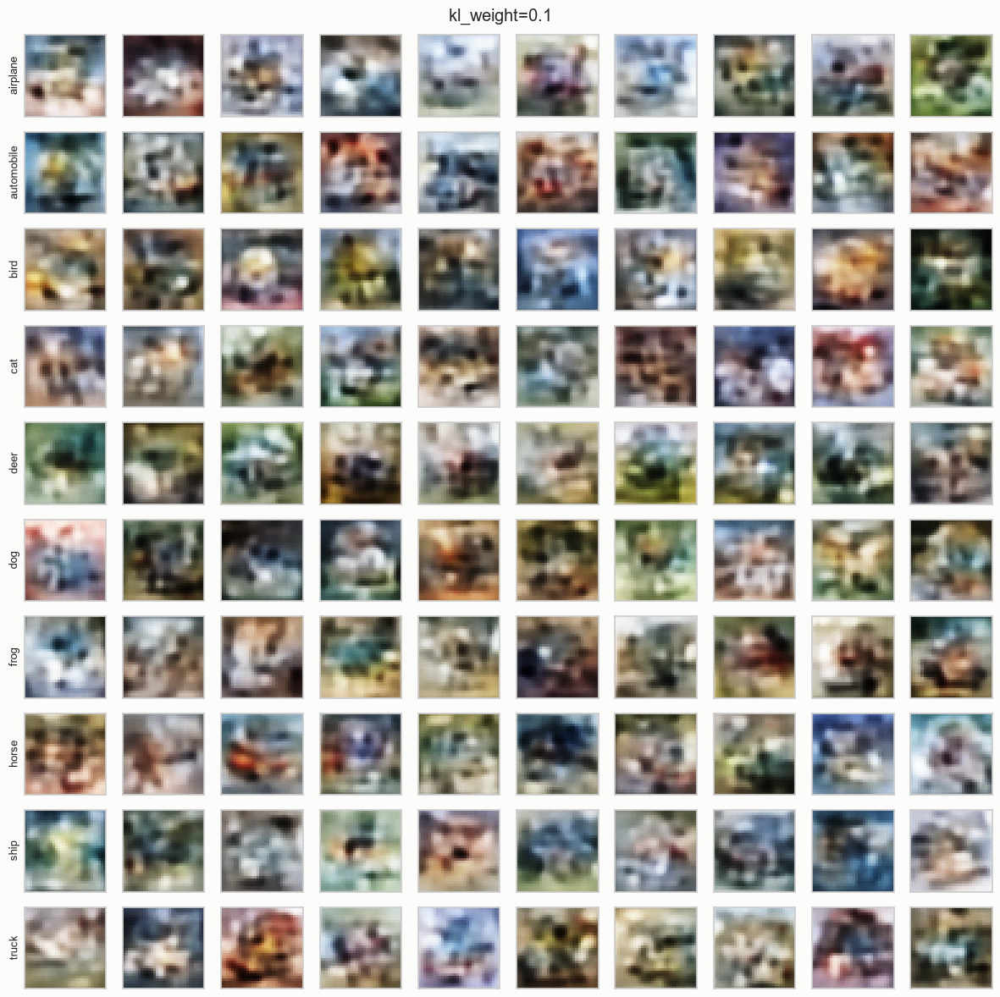

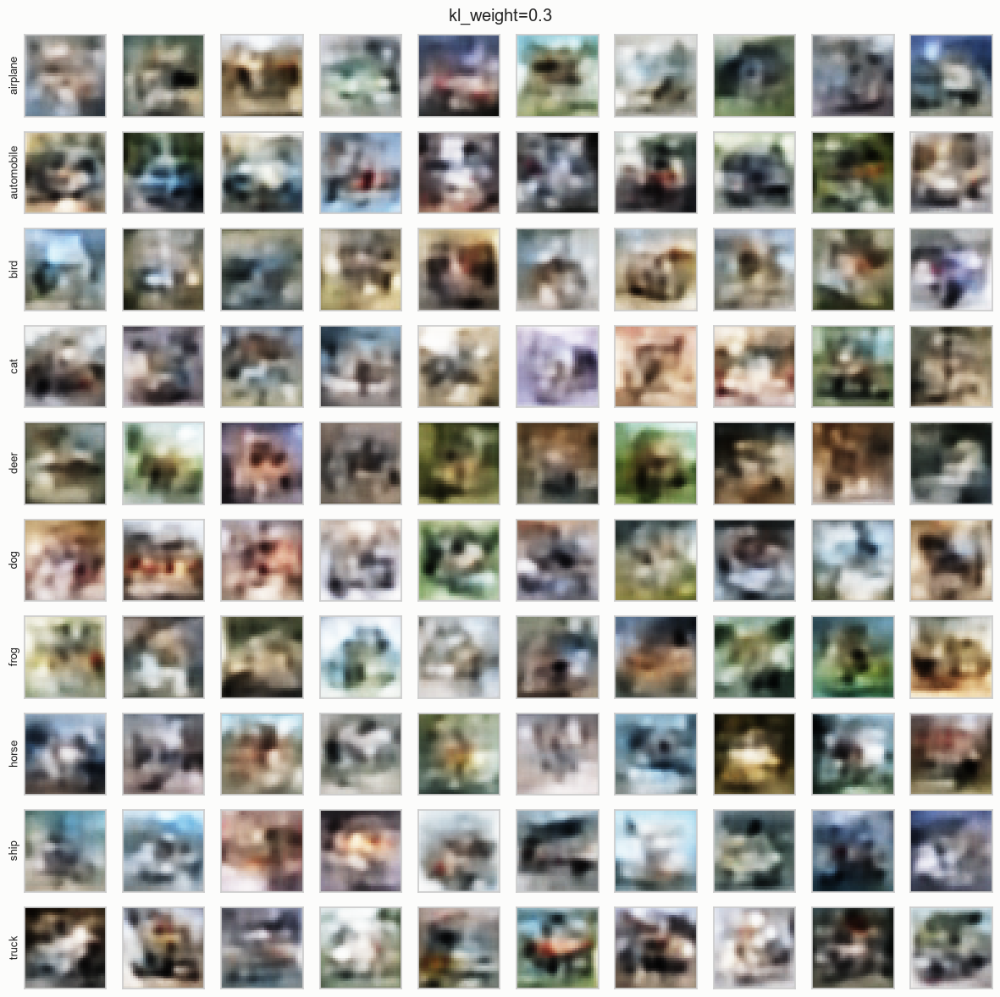

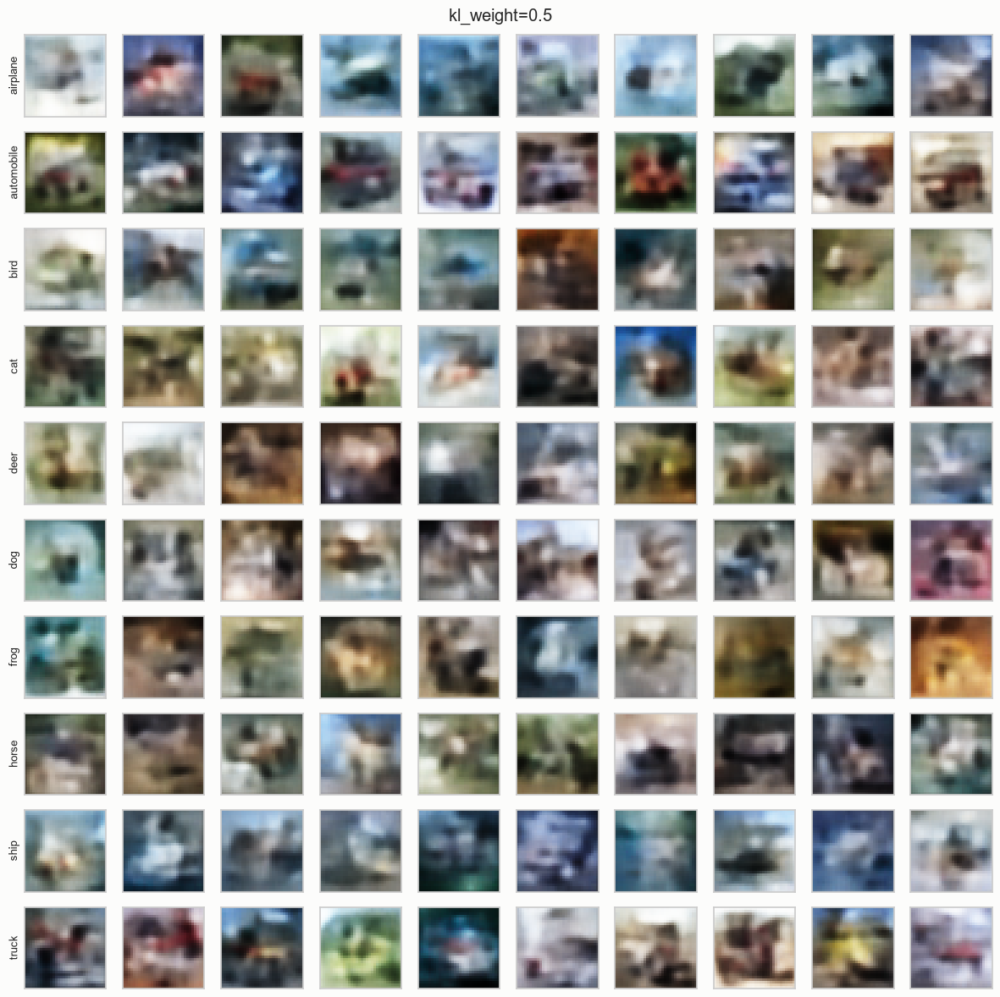

In [16]:
# Generate a sample of images per variant and preview them (visual sanity check before NMI scoring below).
exp2_images, exp2_labels = {}, {}

for kw in kl_weight_variants:
    exp2_images[kw], exp2_labels[kw] = generate_class_images(exp2_cvaes[kw], baseline_results["latent_dim"])
    preview_grid(exp2_images[kw], exp2_labels[kw], title=f"kl_weight={kw}")

In [17]:
# Score each variant by NMI (Section 3.1) and log nmi_score + val loss into the shared results dict.
for key in [k for k in results if k.startswith("exp2_kl_weight_")]:
    del results[key]

for kw in kl_weight_variants:
    results[f"exp2_kl_weight_{kw}"] = {
        "nmi_score": compute_nmi(exp2_cvaes[kw], baseline_results["latent_dim"]),
        "val_loss": exp2_histories[kw]["val_loss"][-1],
        "fid": None,  # FID is only tracked for baseline and final model
    }

pd.DataFrame(results).T


,nmi_score,val_loss,fid
baseline,0.107268,1820.264160,NaN
exp1_latent_dim_64,0.137352,1818.485107,NaN
exp1_latent_dim_256,0.108499,1818.719482,NaN
exp1_latent_dim_512,0.087113,1819.919312,NaN
exp2_kl_weight_0.1,0.047066,1743.003540,NaN
exp2_kl_weight_0.3,0.084174,1769.881714,NaN
exp2_kl_weight_0.5,0.098599,1788.606689,NaN


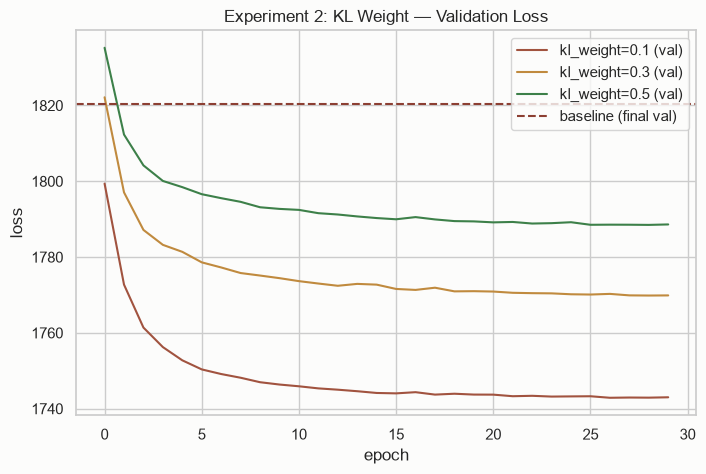

In [18]:
# Plot each variant's validation loss curve against the baseline's, on the same axes.
fig, ax = plt.subplots(figsize=(8, 5))
for i, kw in enumerate(kl_weight_variants):
    ax.plot(exp2_histories[kw]["val_loss"], label=f"kl_weight={kw} (val)", color=PALETTE[i])
ax.axhline(baseline_results["final_val_loss"], color=PALETTE[6], linestyle="--", label="baseline (final val)")
ax.set_xlabel("epoch")
ax.set_ylabel("loss")
ax.set_title("Experiment 2: KL Weight — Validation Loss")
ax.legend()
plt.show()

### Conclusion

None of the reduced KL weights exceeded the baseline NMI of `0.1073`: the scores increased monotonically from `0.0471` at `0.1`, to `0.0842` at `0.3`, and `0.0986` at `0.5`. Their lower raw validation losses are not directly comparable with the baseline because changing the KL coefficient changes the objective's scale. No KL-weight variant was retained for final selection.

## 6. Experiment 3: Architecture Depth

![Architecture depth experiment](../../images/experiment-3-architecture-depth.png)

Our baseline VAE had a very shallow conv stack (2 layers, bottlenecking at 8x8). We propose a deeper architecture, a third conv/deconv layer pair, doubling channels at each downsample and bottlenecking at 4x4 instead. Therefore, the encoder/decoder has more room to discover features and textures (edges, then textures, then parts) that a single shallow stack can't easily separate out.

Encoder Architecture:

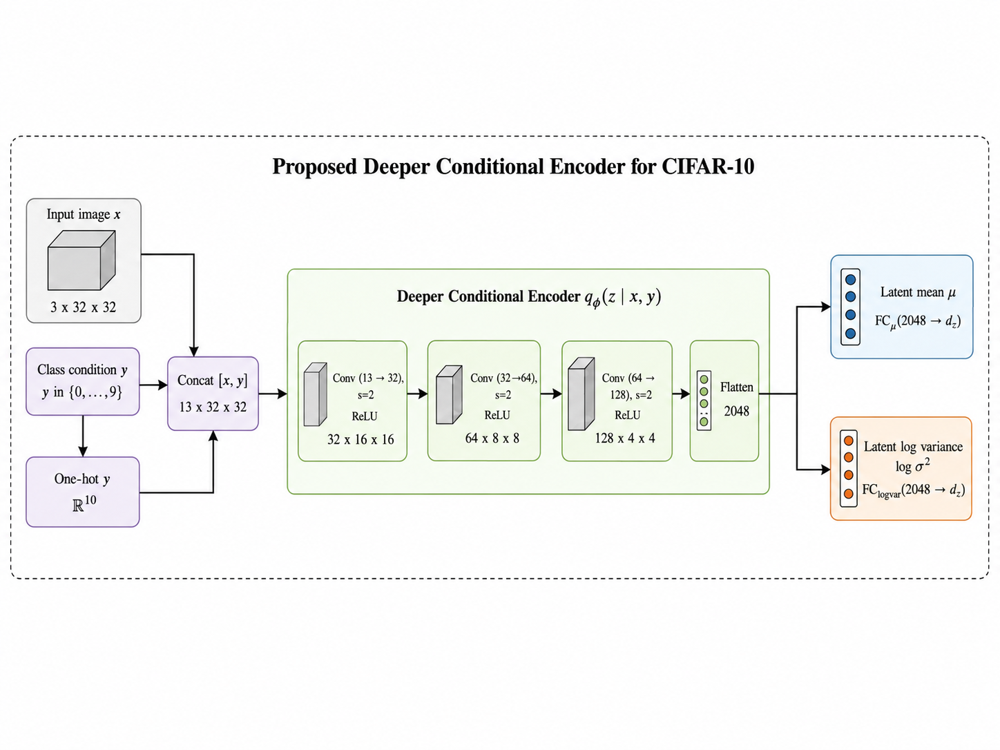

Decoder Architecture:

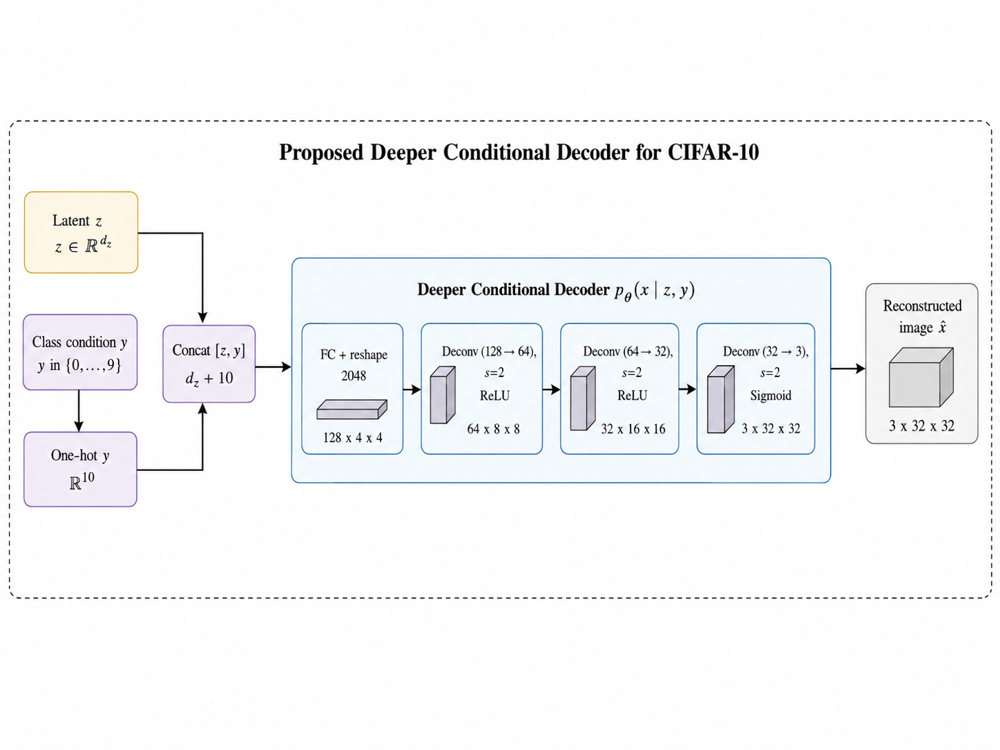

In [19]:
# Deeper Encoder/Decoder: one extra conv/deconv layer pair vs. baseline, doubling channels per downsample, bottlenecking at 4x4 instead of 8x8.
class DeepEncoder(nn.Module):
    def __init__(self, num_classes, latent_dim):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(3 + num_classes, 32, kernel_size=3, stride=2, padding=1),  # 32x32 -> 16x16
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),  # 16x16 -> 8x8
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),  # 8x8 -> 4x4
            nn.ReLU(),
        )
        self.fc_mean = nn.Linear(128 * 4 * 4, latent_dim)
        self.fc_log_var = nn.Linear(128 * 4 * 4, latent_dim)
        self.sampling = Sampling()

    def forward(self, x, y):
        y_map = y.view(y.size(0), -1, 1, 1).expand(-1, -1, x.size(2), x.size(3))
        x = torch.cat([x, y_map], dim=1)

        features = self.conv(x).flatten(start_dim=1)
        z_mean = self.fc_mean(features)
        z_log_var = self.fc_log_var(features)
        z = self.sampling(z_mean, z_log_var)
        return z_mean, z_log_var, z


class DeepDecoder(nn.Module):
    def __init__(self, num_classes, latent_dim):
        super().__init__()
        self.fc = nn.Linear(latent_dim + num_classes, 128 * 4 * 4)
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),  # 4x4 -> 8x8
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),  # 8x8 -> 16x16
            nn.ReLU(),
            nn.ConvTranspose2d(32, 3, kernel_size=3, stride=2, padding=1, output_padding=1),  # 16x16 -> 32x32
            nn.Sigmoid(),
        )

    def forward(self, z, y):
        x = torch.cat([z, y], dim=1)
        x = self.fc(x).view(-1, 128, 4, 4)
        return self.deconv(x)


# Build and train a CVAE identical to baseline except for the deeper encoder/decoder (latent_dim, kl_weight held at baseline's values).
encoder = DeepEncoder(num_classes, baseline_results["latent_dim"])
decoder = DeepDecoder(num_classes, baseline_results["latent_dim"])
exp3_cvae = CVAE(encoder, decoder, kl_weight=baseline_results["kl_weight"])
exp3_cvae, exp3_history = train_cvae(exp3_cvae)

trained 30 epochs - final train_loss: 1816.33 - final val_loss: 1816.91


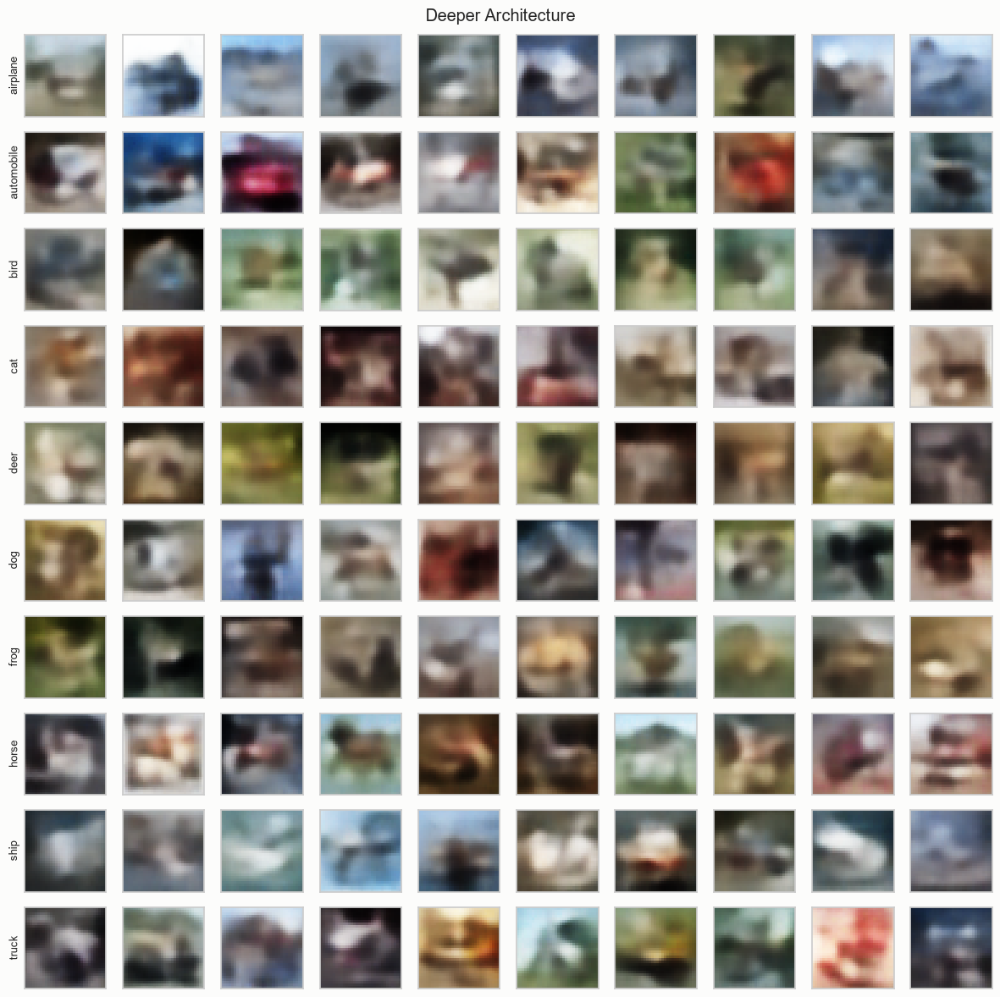

In [20]:
# Generate a sample of images and preview them (visual sanity check before NMI scoring below).
exp3_images, exp3_labels = generate_class_images(exp3_cvae, baseline_results["latent_dim"])
preview_grid(exp3_images, exp3_labels, title="Deeper Architecture")

In [21]:
# Score with NMI (Section 3.1) and log nmi_score + val loss into the shared results dict.
results["exp3_deeper_architecture"] = {
    "nmi_score": compute_nmi(exp3_cvae, baseline_results["latent_dim"]),
    "val_loss": exp3_history["val_loss"][-1],
    "fid": None,  # FID is only tracked for baseline and final model
}

pd.DataFrame(results).T


,nmi_score,val_loss,fid
baseline,0.107268,1820.264160,NaN
exp1_latent_dim_64,0.137352,1818.485107,NaN
exp1_latent_dim_256,0.108499,1818.719482,NaN
exp1_latent_dim_512,0.087113,1819.919312,NaN
exp2_kl_weight_0.1,0.047066,1743.003540,NaN
exp2_kl_weight_0.3,0.084174,1769.881714,NaN
exp2_kl_weight_0.5,0.098599,1788.606689,NaN
exp3_deeper_architecture,0.118919,1816.910278,NaN


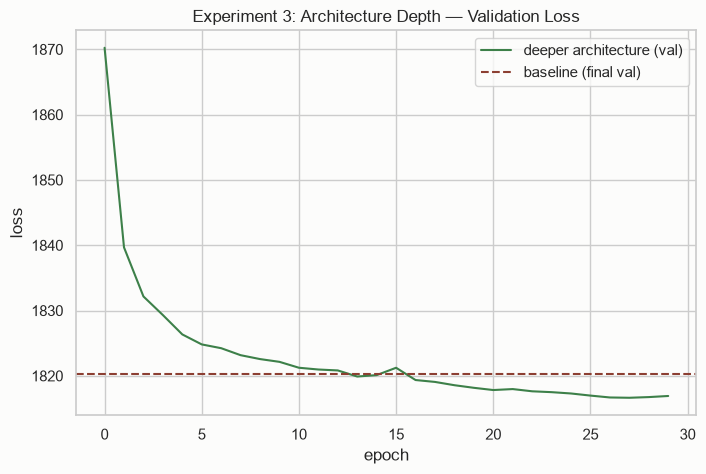

In [22]:
# Plot this experiment's validation loss curve against the baseline's, on the same axes.
fig, ax = plt.subplots(figsize=(8, 5))
ax.plot(exp3_history["val_loss"], label="deeper architecture (val)", color=PALETTE[2])
ax.axhline(baseline_results["final_val_loss"], color=PALETTE[6], linestyle="--", label="baseline (final val)")
ax.set_xlabel("epoch")
ax.set_ylabel("loss")
ax.set_title("Experiment 3: Architecture Depth — Validation Loss")
ax.legend()
plt.show()

### Conclusion

The deeper architecture raised NMI from `0.1073` to `0.1189` (`+10.9%`) and reduced validation loss from `1,820.26` to `1,816.91`. This was a measurable improvement, but its NMI remained below the strongest latent-dimension, conditioning, and augmentation variants.

## 7. Experiment 4: Color vs. Grayscale

![Color versus grayscale experiment](../../images/experiment-4-color-vs-grayscale.png)

We hypothesize that converting images to grayscale will reduce NMI for classes that rely on color cues, such as bird, cat, deer, and dog. Grayscale also simplifies the input and could make shape or texture features easier to model, so the experiment evaluates both effects empirically.

In [23]:
# Convert the training/validation images to grayscale (single channel), keeping the [0, 1] scale so BCE loss stays comparable.
luminance_weights = torch.tensor([0.2989, 0.5870, 0.1140]).view(1, 3, 1, 1)
x_train_gray = (x_train * luminance_weights).sum(dim=1, keepdim=True)
x_val_gray = (x_val * luminance_weights).sum(dim=1, keepdim=True)

print("x_train_gray:", x_train_gray.shape, "range:", x_train_gray.min().item(), "-", x_train_gray.max().item())

x_train_gray: torch.Size([45000, 1, 32, 32]) range: 0.0 - 0.9999000430107117


In [24]:
# GrayEncoder/GrayDecoder: identical to baseline's shallow stack except 1 input/output channel instead of 3.
class GrayEncoder(nn.Module):
    def __init__(self, num_classes, latent_dim):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(1 + num_classes, 32, kernel_size=3, stride=2, padding=1),  # 32x32 -> 16x16
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),  # 16x16 -> 8x8
            nn.ReLU(),
        )
        self.fc_mean = nn.Linear(64 * 8 * 8, latent_dim)
        self.fc_log_var = nn.Linear(64 * 8 * 8, latent_dim)
        self.sampling = Sampling()

    def forward(self, x, y):
        y_map = y.view(y.size(0), -1, 1, 1).expand(-1, -1, x.size(2), x.size(3))
        x = torch.cat([x, y_map], dim=1)

        features = self.conv(x).flatten(start_dim=1)
        z_mean = self.fc_mean(features)
        z_log_var = self.fc_log_var(features)
        z = self.sampling(z_mean, z_log_var)
        return z_mean, z_log_var, z


class GrayDecoder(nn.Module):
    def __init__(self, num_classes, latent_dim):
        super().__init__()
        self.fc = nn.Linear(latent_dim + num_classes, 64 * 8 * 8)
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),  # 8x8 -> 16x16
            nn.ReLU(),
            nn.ConvTranspose2d(32, 1, kernel_size=3, stride=2, padding=1, output_padding=1),  # 16x16 -> 32x32
            nn.Sigmoid(),
        )

    def forward(self, z, y):
        x = torch.cat([z, y], dim=1)
        x = self.fc(x).view(-1, 64, 8, 8)
        return self.deconv(x)


# Build and train a CVAE identical to baseline (latent_dim, kl_weight held at baseline's values) except for the grayscale input/output.
encoder = GrayEncoder(num_classes, baseline_results["latent_dim"])
decoder = GrayDecoder(num_classes, baseline_results["latent_dim"])
exp4_cvae = CVAE(encoder, decoder, kl_weight=baseline_results["kl_weight"])
exp4_cvae, exp4_history = train_cvae(exp4_cvae, x_train_data=x_train_gray, x_val_data=x_val_gray)

trained 30 epochs - final train_loss: 632.77 - final val_loss: 632.58


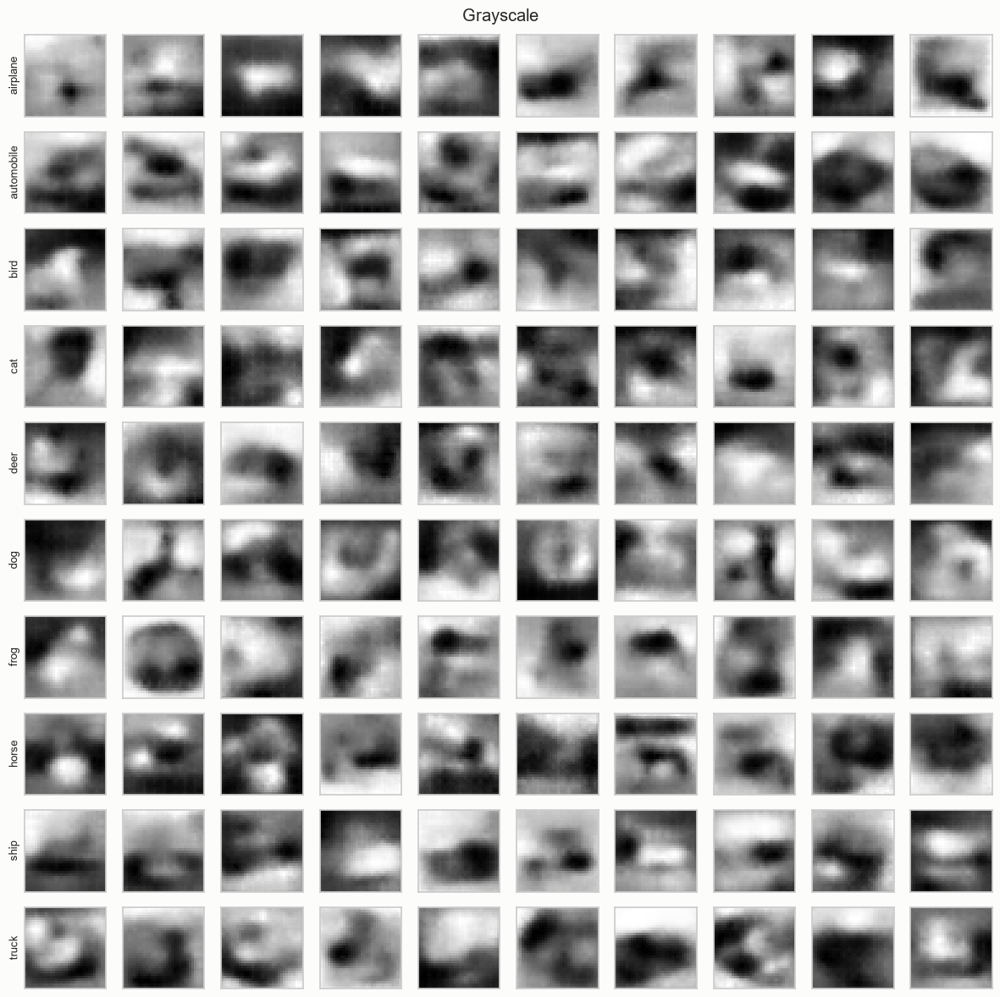

In [25]:
# Generate a sample of images and preview them (visual sanity check before NMI scoring below).
exp4_images, exp4_labels = generate_class_images(exp4_cvae, baseline_results["latent_dim"])
preview_grid(exp4_images, exp4_labels, title="Grayscale")

In [26]:
# Score with NMI (Section 3.1), overall and per-class classifier accuracy (diagnostic for the discussion below), and log into the shared results dict.
exp4_score_images, exp4_score_labels = generate_class_images(exp4_cvae, baseline_results["latent_dim"], images_per_class=100)
exp4_classifier_input = exp4_score_images.repeat(1, 3, 1, 1)
with torch.no_grad():
    exp4_predicted = classifier(exp4_classifier_input).argmax(dim=1)
exp4_nmi_score = normalized_mutual_info_score(exp4_score_labels.numpy(), exp4_predicted.cpu().numpy())
exp4_per_class_acc = [(exp4_predicted[exp4_score_labels == c] == c).float().mean().item() for c in range(num_classes)]

results["exp4_grayscale"] = {
    "nmi_score": exp4_nmi_score,
    "val_loss": exp4_history["val_loss"][-1],
    "fid": None,  # FID is only tracked for baseline and final model; also not comparable across color/grayscale anyway
}

exp4_per_class_table = pd.DataFrame(
    {
        'baseline_rgb': baseline_per_class_acc,
        'grayscale': exp4_per_class_acc,
    },
    index=class_names,
).rename_axis("class")
display(exp4_per_class_table.round(3))

pd.DataFrame(results).T


,baseline_rgb,grayscale
class,,
airplane,0.17,0.29
automobile,0.06,0.01
bird,0.47,0.22
cat,0.53,0.37
deer,0.42,0.20
dog,0.10,0.03
frog,0.00,0.00
horse,0.11,0.01
ship,0.65,0.63


,nmi_score,val_loss,fid
baseline,0.107268,1820.264160,NaN
exp1_latent_dim_64,0.137352,1818.485107,NaN
exp1_latent_dim_256,0.108499,1818.719482,NaN
exp1_latent_dim_512,0.087113,1819.919312,NaN
exp2_kl_weight_0.1,0.047066,1743.003540,NaN
exp2_kl_weight_0.3,0.084174,1769.881714,NaN
exp2_kl_weight_0.5,0.098599,1788.606689,NaN
exp3_deeper_architecture,0.118919,1816.910278,NaN
exp4_grayscale,0.052624,632.576111,NaN


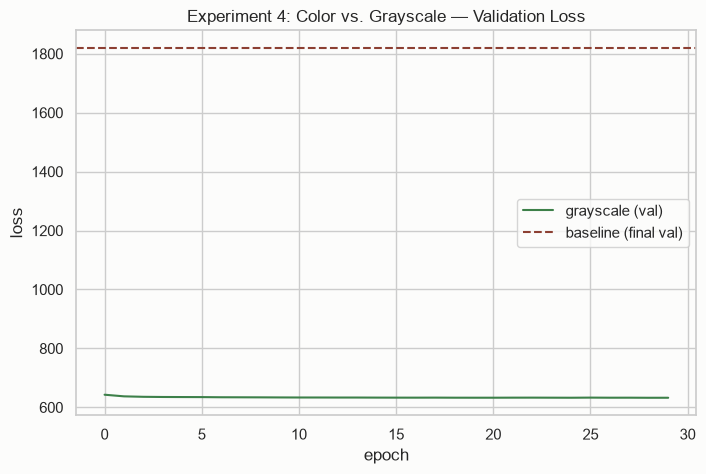

In [27]:
# Plot this experiment's validation loss curve against the color baseline's, on the same axes.
fig, ax = plt.subplots(figsize=(8, 5))
ax.plot(exp4_history["val_loss"], label="grayscale (val)", color=PALETTE[2])
ax.axhline(baseline_results["final_val_loss"], color=PALETTE[6], linestyle="--", label="baseline (final val)")
ax.set_xlabel("epoch")
ax.set_ylabel("loss")
ax.set_title("Experiment 4: Color vs. Grayscale — Validation Loss")
ax.legend()
plt.show()

### Discussion: Color vs. Grayscale, Empirically

Grayscale reduced overall NMI from `0.1073` to `0.0526`, a `50.9%` decrease. The per-class comparison supports the color-cue hypothesis: classifier agreement fell from `0.47` to `0.22` for bird, `0.53` to `0.37` for cat, `0.42` to `0.20` for deer, and `0.10` to `0.03` for dog. Airplane increased from `0.17` to `0.29`, while ship was largely preserved (`0.65` to `0.63`), indicating that the effect was class-dependent. The grayscale validation loss is not compared numerically with RGB because it sums reconstruction error over one channel rather than three.

## 8. Experiment 5: Engineered Conditioning Features

![Engineered conditioning features experiment](../../images/experiment-5-engineered-conditioning.png)

A bare one-hot label identifies the target class but supplies no direct visual attributes. We concatenate each class's mean per-channel color statistics (from `vae_gan_eda.ipynb` Section 5) with the one-hot vector, giving the model a richer conditioning signal. The experiment tests whether those statistics add useful information or are redundant with the one-hot labels.
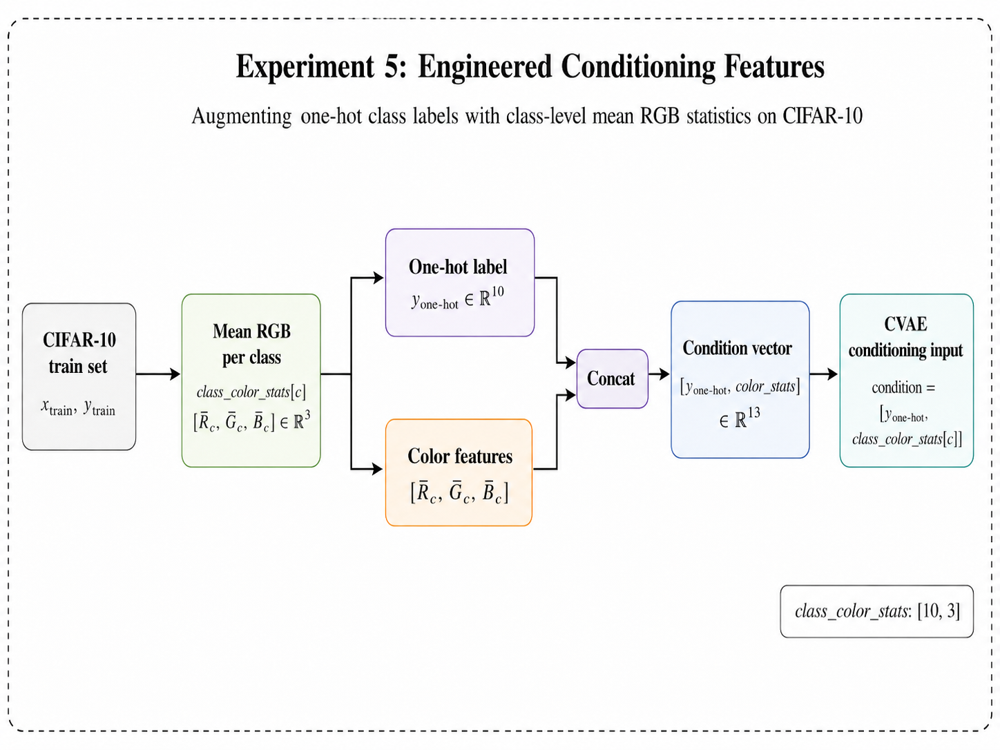

In [28]:
# Compute each class's mean per-channel (R, G, B) statistics from the training set, building a small per-class auxiliary feature vector.
class_color_stats = torch.stack([x_train[y_train == c].mean(dim=[0, 2, 3]) for c in range(num_classes)])
print("class_color_stats:", class_color_stats.shape)

class_color_stats: torch.Size([10, 3])


In [29]:
# Build the augmented conditioning vector [one-hot, class_color_stats] for every image, by indexing class_color_stats with each image's label.
y_train_aux = torch.cat([y_train_onehot, class_color_stats[y_train]], dim=1)
y_val_aux = torch.cat([y_val_onehot, class_color_stats[y_val]], dim=1)
conditioning_dim = y_train_aux.size(1)
print("conditioning_dim (one-hot + RGB stats):", conditioning_dim)

# Build and train a CVAE identical to baseline (latent_dim, kl_weight held at baseline's values) except the conditioning vector is augmented.
# Encoder/Decoder are reused as-is: their "num_classes" arg is really just the conditioning vector width, so it accepts the wider vector directly.
encoder = Encoder(conditioning_dim, baseline_results["latent_dim"])
decoder = Decoder(conditioning_dim, baseline_results["latent_dim"])
exp5_cvae = CVAE(encoder, decoder, kl_weight=baseline_results["kl_weight"])
exp5_cvae, exp5_history = train_cvae(exp5_cvae, y_train_data=y_train_aux, y_val_data=y_val_aux)

conditioning_dim (one-hot + RGB stats): 13


trained 30 epochs - final train_loss: 1817.90 - final val_loss: 1818.68


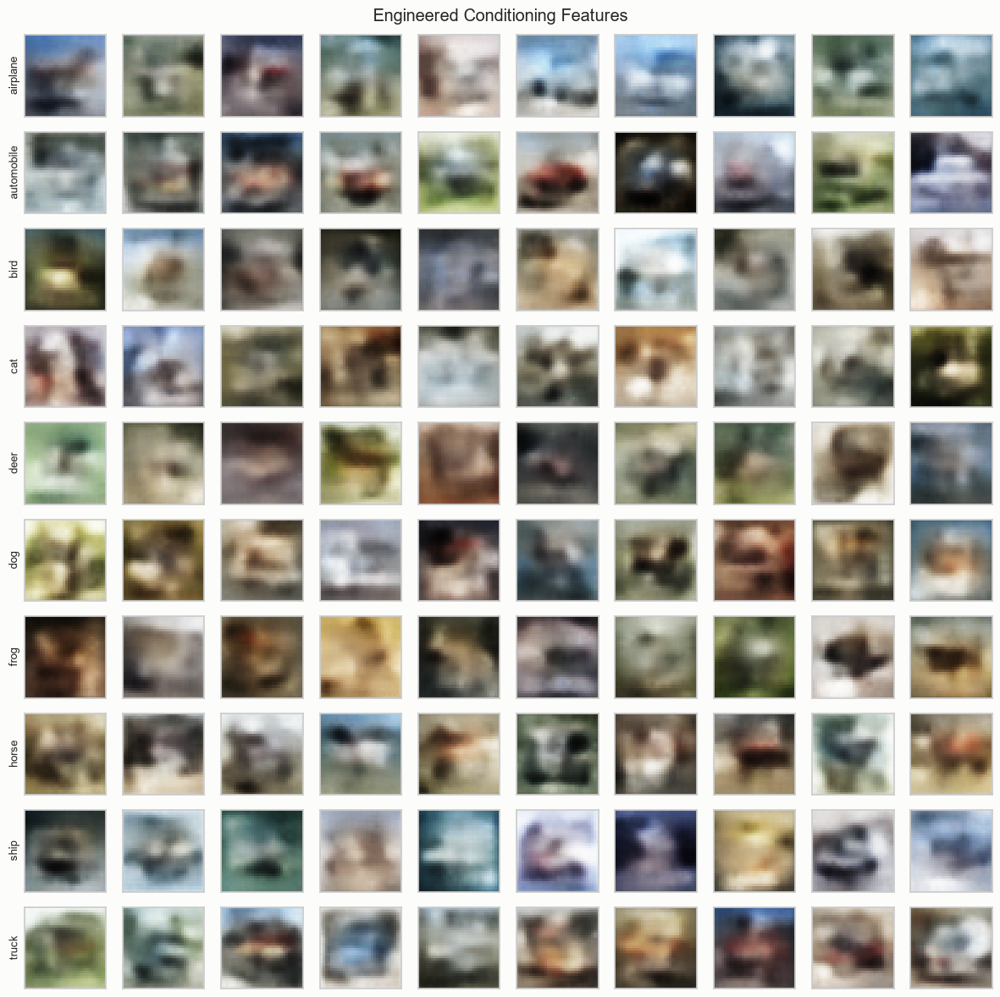

In [30]:
# Generate a sample of images and preview them (visual sanity check before NMI scoring below).
# Conditioning per class is [one-hot, class_color_stats] to match what the model was trained on.
label_vectors_exp5 = torch.cat([torch.eye(num_classes, device=device), class_color_stats.to(device)], dim=1)
exp5_images, exp5_labels = generate_class_images(exp5_cvae, baseline_results["latent_dim"], label_vectors=label_vectors_exp5)
preview_grid(exp5_images, exp5_labels, title="Engineered Conditioning Features")

In [31]:
# Score with NMI (Section 3.1) and log nmi_score + val loss into the shared results dict.
results["exp5_engineered_conditioning"] = {
    "nmi_score": compute_nmi(exp5_cvae, baseline_results["latent_dim"], label_vectors=label_vectors_exp5),
    "val_loss": exp5_history["val_loss"][-1],
    "fid": None,  # FID is only tracked for baseline and final model
}

pd.DataFrame(results).T


,nmi_score,val_loss,fid
baseline,0.107268,1820.264160,NaN
exp1_latent_dim_64,0.137352,1818.485107,NaN
exp1_latent_dim_256,0.108499,1818.719482,NaN
exp1_latent_dim_512,0.087113,1819.919312,NaN
exp2_kl_weight_0.1,0.047066,1743.003540,NaN
exp2_kl_weight_0.3,0.084174,1769.881714,NaN
exp2_kl_weight_0.5,0.098599,1788.606689,NaN
exp3_deeper_architecture,0.118919,1816.910278,NaN
exp4_grayscale,0.052624,632.576111,NaN
exp5_engineered_conditioning,0.140243,1818.683960,NaN


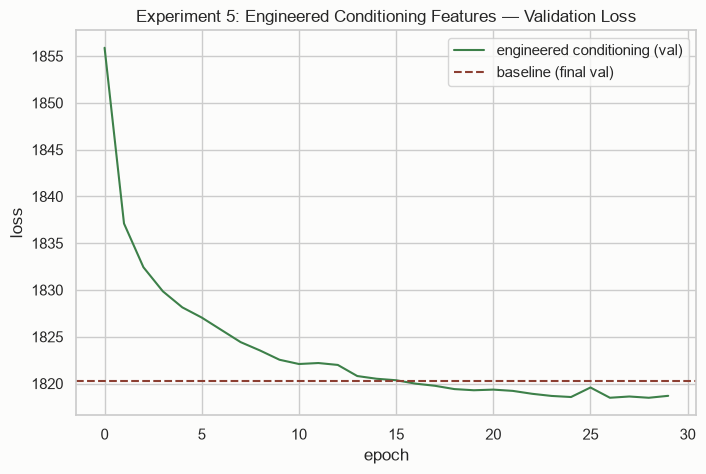

In [32]:
# Plot this experiment's validation loss curve against the baseline's, on the same axes.
fig, ax = plt.subplots(figsize=(8, 5))
ax.plot(exp5_history["val_loss"], label="engineered conditioning (val)", color=PALETTE[2])
ax.axhline(baseline_results["final_val_loss"], color=PALETTE[6], linestyle="--", label="baseline (final val)")
ax.set_xlabel("epoch")
ax.set_ylabel("loss")
ax.set_title("Experiment 5: Engineered Conditioning Features — Validation Loss")
ax.legend()
plt.show()

### Notes

Engineered conditioning raised NMI from `0.1073` to `0.1402` (`+30.7%`) and reduced validation loss from `1,820.26` to `1,818.68`.

**Conclusion:** The class-level RGB statistics provided useful information beyond the one-hot label and produced the second-highest eligible ablation NMI. The setting remained a strong candidate, but augmentation was selected because its NMI was slightly higher.

## 9. Experiment 6: Data Augmentation

![Data augmentation experiment](../../images/experiment-6-data-augmentation.png)

The augmentation pipeline applies random horizontal flips and small translations, exposing the model to more visual variation per class without collecting additional data. This may increase NMI by reducing sensitivity to the exact training examples, although excessive transformations could obscure class-relevant structure.

In [33]:
# Define an augmentation pipeline (random horizontal flip + random translation via pad-then-crop) applied to the training set only.
def augment_batch(x, translate_px=4):
    flipped = torch.where(torch.rand(x.size(0), 1, 1, 1) < 0.5, x.flip(dims=[3]), x)

    padded = F.pad(flipped, [translate_px] * 4, mode="reflect")
    augmented = torch.empty_like(x)
    for i in range(x.size(0)):
        dx, dy = torch.randint(0, 2 * translate_px + 1, (2,))
        augmented[i] = padded[i, :, dy : dy + 32, dx : dx + 32]
    return augmented


# Build an augmented copy of the training set and append it to the original, doubling the effective training set with new variation.
torch.manual_seed(42)
x_train_augmented = augment_batch(x_train)
x_train_combined = torch.cat([x_train, x_train_augmented])
y_train_onehot_combined = torch.cat([y_train_onehot, y_train_onehot])
print("x_train_combined:", x_train_combined.shape)

x_train_combined: torch.Size([90000, 3, 32, 32])


In [34]:
# Build and train a CVAE identical to baseline (latent_dim, kl_weight held at baseline's values) except the training set is the augmented one.
encoder = Encoder(num_classes, baseline_results["latent_dim"])
decoder = Decoder(num_classes, baseline_results["latent_dim"])
exp6_cvae = CVAE(encoder, decoder, kl_weight=baseline_results["kl_weight"])
exp6_cvae, exp6_history = train_cvae(exp6_cvae, x_train_data=x_train_combined, y_train_data=y_train_onehot_combined)

trained 30 epochs - final train_loss: 1817.88 - final val_loss: 1817.19


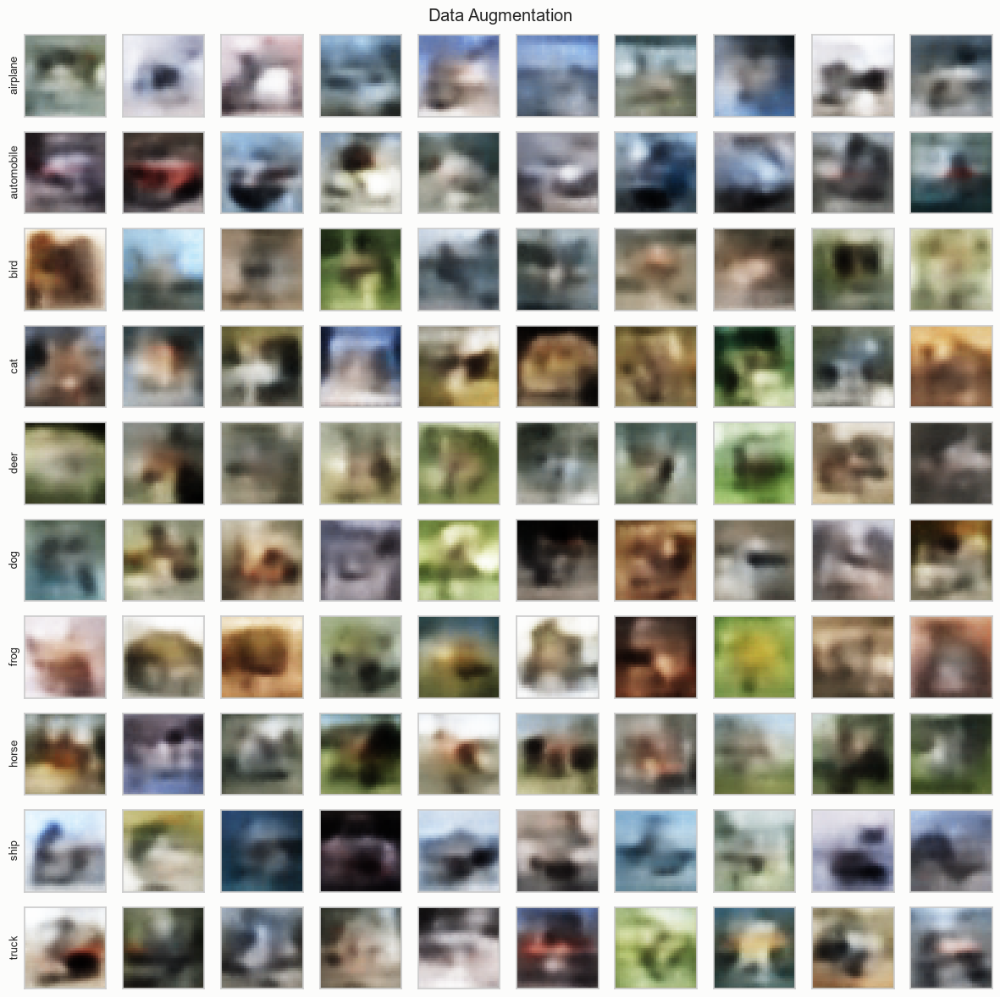

In [35]:
# Generate a sample of images and preview them (visual sanity check before NMI scoring below).
exp6_images, exp6_labels = generate_class_images(exp6_cvae, baseline_results["latent_dim"])
preview_grid(exp6_images, exp6_labels, title="Data Augmentation")

In [36]:
# Score with NMI (Section 3.1) and log nmi_score + val loss into the shared results dict.
results["exp6_data_augmentation"] = {
    "nmi_score": compute_nmi(exp6_cvae, baseline_results["latent_dim"]),
    "val_loss": exp6_history["val_loss"][-1],
    "fid": None,  # FID is only tracked for baseline and final model
}

pd.DataFrame(results).T


,nmi_score,val_loss,fid
baseline,0.107268,1820.264160,NaN
exp1_latent_dim_64,0.137352,1818.485107,NaN
exp1_latent_dim_256,0.108499,1818.719482,NaN
exp1_latent_dim_512,0.087113,1819.919312,NaN
exp2_kl_weight_0.1,0.047066,1743.003540,NaN
exp2_kl_weight_0.3,0.084174,1769.881714,NaN
exp2_kl_weight_0.5,0.098599,1788.606689,NaN
exp3_deeper_architecture,0.118919,1816.910278,NaN
exp4_grayscale,0.052624,632.576111,NaN
exp5_engineered_conditioning,0.140243,1818.683960,NaN


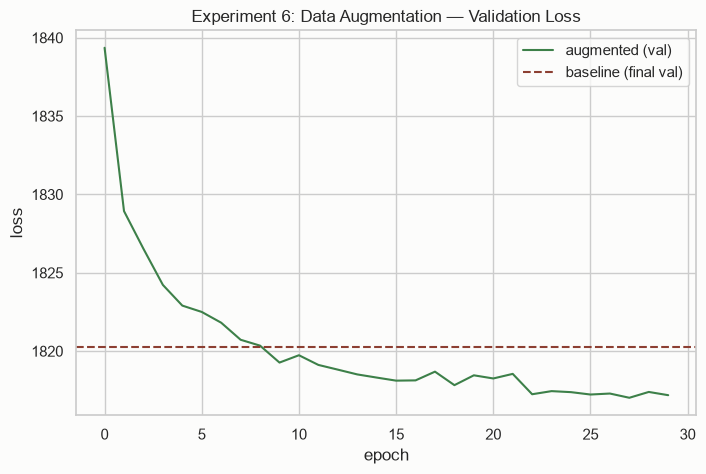

In [37]:
# Plot this experiment's validation loss curve against the baseline's, on the same axes.
fig, ax = plt.subplots(figsize=(8, 5))
ax.plot(exp6_history["val_loss"], label="augmented (val)", color=PALETTE[2])
ax.axhline(baseline_results["final_val_loss"], color=PALETTE[6], linestyle="--", label="baseline (final val)")
ax.set_xlabel("epoch")
ax.set_ylabel("loss")
ax.set_title("Experiment 6: Data Augmentation — Validation Loss")
ax.legend()
plt.show()

### Conclusion

Soft augmentation achieved the highest eligible ablation NMI, increasing the score from `0.1073` to `0.1412` (`+31.6%`) while reducing validation loss from `1,820.26` to `1,817.19`. It was therefore selected for the final-model retraining.

## 10. Final Model

Apply the decision rule from Section 3.3 to select and retrain the strongest single experimental configuration by NMI. Experiment 4 changes the output from RGB to grayscale, so it is reported separately and excluded from final-model selection. This is the only model besides the baseline whose weights are saved.

### 10.1 Select Best Settings


In [38]:
# Select the strongest eligible single-change experiment by NMI.
eligible_keys = [
    "baseline",
    "exp1_latent_dim_64", "exp1_latent_dim_256", "exp1_latent_dim_512",
    "exp2_kl_weight_0.1", "exp2_kl_weight_0.3", "exp2_kl_weight_0.5",
    "exp3_deeper_architecture",
    "exp5_engineered_conditioning",
    "exp6_data_augmentation",
]
selected_experiment = max(eligible_keys, key=lambda name: results[name]["nmi_score"])

final_settings = {
    "latent_dim": baseline_results["latent_dim"],
    "kl_weight": baseline_results["kl_weight"],
    "architecture": "baseline",
    "conditioning": "baseline",
    "augmentation": False,
}
if selected_experiment.startswith("exp1_latent_dim_"):
    final_settings["latent_dim"] = int(selected_experiment.rsplit("_", 1)[-1])
elif selected_experiment.startswith("exp2_kl_weight_"):
    final_settings["kl_weight"] = float(selected_experiment.rsplit("_", 1)[-1])
elif selected_experiment == "exp3_deeper_architecture":
    final_settings["architecture"] = "deep"
elif selected_experiment == "exp5_engineered_conditioning":
    final_settings["conditioning"] = "engineered"
elif selected_experiment == "exp6_data_augmentation":
    final_settings["augmentation"] = True

print("selected_experiment:", selected_experiment)
for axis, choice in final_settings.items():
    print(f"{axis}: {choice}")


selected_experiment: exp6_data_augmentation
latent_dim: 128
kl_weight: 1.0
architecture: baseline
conditioning: baseline
augmentation: True


### 10.2 Train the Final Model


In [39]:
# Rebuild and retrain the selected single-change configuration.
final_conditioning_dim = conditioning_dim if final_settings["conditioning"] == "engineered" else num_classes
if final_settings["architecture"] == "deep":
    final_encoder = DeepEncoder(final_conditioning_dim, final_settings["latent_dim"])
    final_decoder = DeepDecoder(final_conditioning_dim, final_settings["latent_dim"])
else:
    final_encoder = Encoder(final_conditioning_dim, final_settings["latent_dim"])
    final_decoder = Decoder(final_conditioning_dim, final_settings["latent_dim"])
final_cvae = CVAE(final_encoder, final_decoder, kl_weight=final_settings["kl_weight"])
final_train_kwargs = {}
final_label_vectors = None
if final_settings["conditioning"] == "engineered":
    final_train_kwargs.update(y_train_data=y_train_aux, y_val_data=y_val_aux)
    final_label_vectors = label_vectors_exp5
elif final_settings["augmentation"]:
    final_train_kwargs.update(x_train_data=x_train_combined, y_train_data=y_train_onehot_combined)
final_cvae, final_history = train_cvae(final_cvae, **final_train_kwargs)


trained 30 epochs - final train_loss: 1818.02 - final val_loss: 1816.97


In [40]:
# Save the final model's native PyTorch weights alongside the baseline checkpoint.
save_state_dict_pt(final_cvae, "vae_final_best.pt")
print("Saved final model weights to vae_final_best.pt")


Saved final model weights to vae_final_best.pt


### 10.3 Evaluate the Final Model


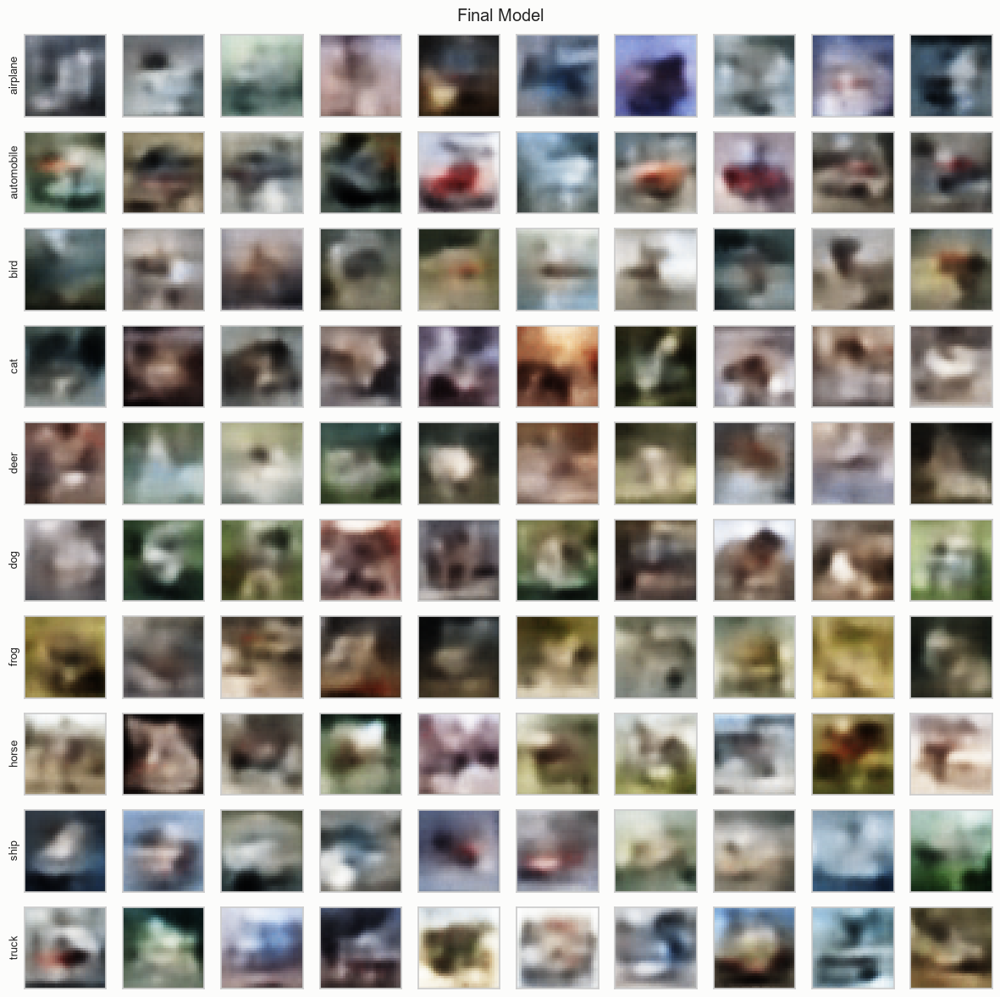

In [41]:
# Generate a sample of images and preview them (visual sanity check before NMI scoring below).
final_images, final_labels = generate_class_images(
    final_cvae, final_settings["latent_dim"], label_vectors=final_label_vectors
)
preview_grid(final_images, final_labels, title="Final Model")


In [42]:
# Score the final model by NMI (Section 3.1) and log nmi_score + val loss into the shared results dict, against the baseline.
results["final_model"] = {
    "nmi_score": compute_nmi(
        final_cvae, final_settings["latent_dim"], label_vectors=final_label_vectors
    ),
    "val_loss": final_history["val_loss"][-1],
    "fid": None,  # filled in by the FID cell below
}

pd.DataFrame(results).T


,nmi_score,val_loss,fid
baseline,0.107268,1820.264160,NaN
exp1_latent_dim_64,0.137352,1818.485107,NaN
exp1_latent_dim_256,0.108499,1818.719482,NaN
exp1_latent_dim_512,0.087113,1819.919312,NaN
exp2_kl_weight_0.1,0.047066,1743.003540,NaN
exp2_kl_weight_0.3,0.084174,1769.881714,NaN
exp2_kl_weight_0.5,0.098599,1788.606689,NaN
exp3_deeper_architecture,0.118919,1816.910278,NaN
exp4_grayscale,0.052624,632.576111,NaN
exp5_engineered_conditioning,0.140243,1818.683960,NaN


In [43]:
# Compute FID with the same TorchMetrics Inception extractor used by the comparison notebook.
def compute_fid(real_images, fake_images, batch_size=128):
    fid = FrechetInceptionDistance(feature=2048, normalize=True).to(device)
    with torch.no_grad():
        for start in range(0, len(real_images), batch_size):
            fid.update(real_images[start : start + batch_size].to(device), real=True)
        for start in range(0, len(fake_images), batch_size):
            fid.update(fake_images[start : start + batch_size].to(device), real=False)
    score = fid.compute().item()
    del fid
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    return score


In [44]:
# Generate 1000 images (100/class) with the baseline model, and reuse the final model's own generated set, to compute FID against real validation images.
baseline_fid_images, _ = generate_class_images(baseline_cvae, baseline_results["latent_dim"], images_per_class=100)
final_fid_images, _ = generate_class_images(
    final_cvae, final_settings["latent_dim"], images_per_class=100, label_vectors=final_label_vectors
)

real_fid_images = x_val[:1000].to(device)
results["baseline"]["fid"] = compute_fid(real_fid_images, baseline_fid_images)
results["final_model"]["fid"] = compute_fid(real_fid_images, final_fid_images)

serializable_results = {
    name: {metric: None if value is None else float(value) for metric, value in metrics.items()}
    for name, metrics in results.items()
}
improvement_results = {
    'selected_experiment': selected_experiment,
    'final_settings': final_settings,
    'results': serializable_results,
}
improvement_results_path = Path('../../results/part_a/vae_improvement_results.json')
improvement_results_path.parent.mkdir(parents=True, exist_ok=True)
with improvement_results_path.open('w', encoding='utf-8') as file:
    json.dump(improvement_results, file, indent=2)
print('Saved improvement results to', improvement_results_path)

pd.DataFrame(results).T


Saved improvement results to ..\..\results\part_a\vae_improvement_results.json


,nmi_score,val_loss,fid
baseline,0.107268,1820.264160,180.085464
exp1_latent_dim_64,0.137352,1818.485107,NaN
exp1_latent_dim_256,0.108499,1818.719482,NaN
exp1_latent_dim_512,0.087113,1819.919312,NaN
exp2_kl_weight_0.1,0.047066,1743.003540,NaN
exp2_kl_weight_0.3,0.084174,1769.881714,NaN
exp2_kl_weight_0.5,0.098599,1788.606689,NaN
exp3_deeper_architecture,0.118919,1816.910278,NaN
exp4_grayscale,0.052624,632.576111,NaN
exp5_engineered_conditioning,0.140243,1818.683960,NaN


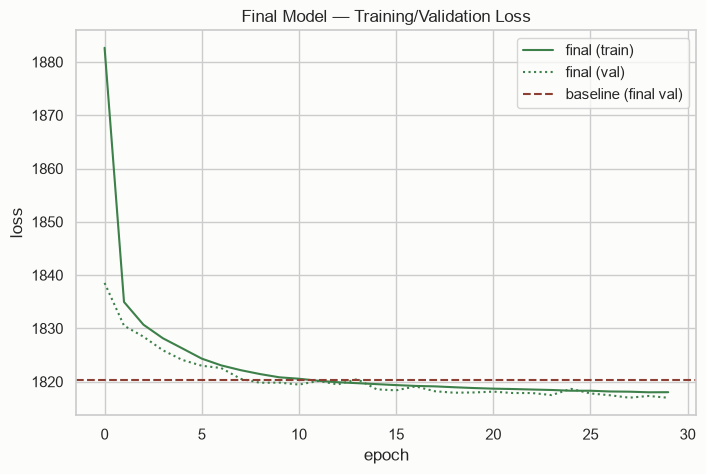

In [45]:
# Plot the final model's training/validation loss curves against the baseline's, on the same axes.
fig, ax = plt.subplots(figsize=(8, 5))
ax.plot(final_history["train_loss"], label="final (train)", color=PALETTE[2])
ax.plot(final_history["val_loss"], label="final (val)", color=PALETTE[2], linestyle=":")
ax.axhline(baseline_results["final_val_loss"], color=PALETTE[6], linestyle="--", label="baseline (final val)")
ax.set_xlabel("epoch")
ax.set_ylabel("loss")
ax.set_title("Final Model — Training/Validation Loss")
ax.legend()
plt.show()


The retrained augmentation model achieved NMI `0.1193`, an absolute gain of `0.0121` (`+11.3%`) over the baseline's `0.1073`, although it did not reproduce the ablation run's `0.1412`. Its FID was `184.509` versus the baseline's `180.085`; because lower is better, this is a deterioration of `4.423` points (`2.46%`).

Section 3.4 puts that gain in context. Two measurements of the unchanged baseline disagree by `0.0104`, so a gain of `0.0121` sits barely outside the spread this protocol produces on its own. The honest reading is that the final model did not clearly improve on the baseline: its class separation is nominally higher by an amount close to measurement noise, and its distributional similarity is worse.

## 11. Ablation Summary

The table and chart below pull the shared `results` dict into one place, so the final model's choice is backed by the numbers already computed during the experiments above, not a new comparison step.

In [46]:
# Build one ablation table from the results dict: baseline, each experiment, and the final model, with NMI score, val loss, and FID (baseline/final only) as columns.
row_order = [
    "baseline",
    "exp1_latent_dim_64", "exp1_latent_dim_256", "exp1_latent_dim_512",
    "exp2_kl_weight_0.1", "exp2_kl_weight_0.3", "exp2_kl_weight_0.5",
    "exp3_deeper_architecture",
    "exp4_grayscale",
    "exp5_engineered_conditioning",
    "exp6_data_augmentation",
    "final_model",
]
ablation_table = pd.DataFrame(results).T.loc[row_order].round(3)
ablation_table


,nmi_score,val_loss,fid
baseline,0.107,1820.264,180.085
exp1_latent_dim_64,0.137,1818.485,NaN
exp1_latent_dim_256,0.108,1818.719,NaN
exp1_latent_dim_512,0.087,1819.919,NaN
exp2_kl_weight_0.1,0.047,1743.004,NaN
exp2_kl_weight_0.3,0.084,1769.882,NaN
exp2_kl_weight_0.5,0.099,1788.607,NaN
exp3_deeper_architecture,0.119,1816.910,NaN
exp4_grayscale,0.053,632.576,NaN
exp5_engineered_conditioning,0.140,1818.684,NaN


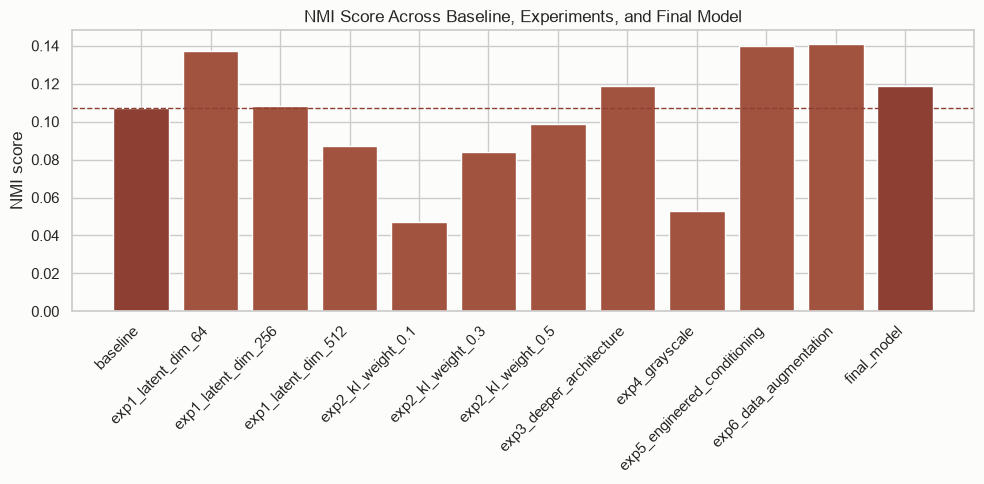

In [47]:
# Bar chart comparing NMI scores across all models.
fig, ax = plt.subplots(figsize=(10, 5))
bar_colors = [PALETTE[6] if name in ("baseline", "final_model") else PALETTE[0] for name in row_order]
ax.bar(row_order, ablation_table["nmi_score"], color=bar_colors)
ax.axhline(results["baseline"]["nmi_score"], color=PALETTE[6], linestyle="--", linewidth=1)
ax.set_ylabel("NMI score")
ax.set_title("NMI Score Across Baseline, Experiments, and Final Model")
plt.setp(ax.get_xticklabels(), rotation=45, ha="right")
plt.tight_layout()
plt.show()


## 12. Conclusion

The latent-64, latent-256, deeper-architecture, engineered-conditioning, and augmentation variants raised NMI above the `0.1073` baseline, although the latent-256 gain was small. Latent 512, every reduced-KL variant, and grayscale performed worse. Soft augmentation produced the best ablation NMI (`0.1412`) and was selected for retraining; the final instance achieved NMI `0.1193` (`+11.3%`) but a worse FID of `184.509` versus `180.085`, showing that its class-separation gain did not extend to distributional similarity.

Read against Section 3.4, the ablation could not have identified a reliable winner. Two measurements of the same unchanged baseline differ by `0.0104` in NMI, which is close to the `0.0121` separating the final model from the baseline and larger than most of the gaps between the experiments themselves. The supported conclusion is that none of the six changes produced an improvement big enough to survive a retrain, and settling the question would need several runs per setting scored against a fixed reference set.

The final and baseline native PyTorch weights are saved as `vae_final_best.pt` and `vae_baseline_best.pt`.